***LOADING LIBRARIES***

In [1]:
pip install cellrank --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install scvelo --upgrade --quiet

In [3]:
pip install python-igraph

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install jgraph --upgrade --quiet

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install louvain

Note: you may need to restart the kernel to use updated packages.


# IMPORTING LIBRARIES

In [1]:
import cellrank as cr

In [2]:
import scvelo as scv
import pandas as pd
#import velocyto as vcy
import time
import scipy
import pickle
import numpy as np
import pandas as pd
import scanpy as scp
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_venn as ven
from matplotlib.gridspec import GridSpec

import sklearn
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, cohen_kappa_score, confusion_matrix, recall_score, classification_report, precision_score
from scipy.stats import spearmanr, zscore
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, Ridge, ElasticNet
import scvelo as scv
scv.logging.print_version()
import jgraph as ig
from sklearn.svm import SVC

Running scvelo 0.2.4 (python 3.8.5) on 2022-01-31 20:23.


In [3]:
import os
os.chdir('/storage/sanjaym/sidrah/CBio/RCT/Holy_Analysis/Close_nostril')

In [4]:
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

Running scvelo 0.2.4 (python 3.8.5) on 2022-01-31 20:23.


In [5]:
file = "close.loom"
ldata = scv.read_loom(file)
ldata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 4480 × 32285
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

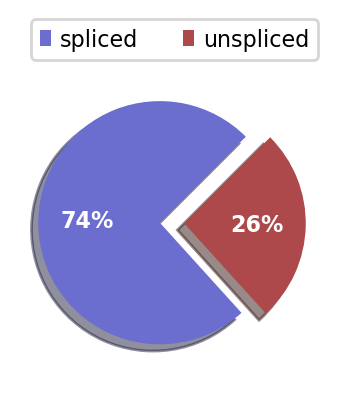

In [6]:
ldata.var_names_make_unique()
scv.pl.proportions(ldata)

# The OSN data being processed for analysis

In [7]:
lf = ldata
lf

AnnData object with n_obs × n_vars = 4480 × 32285
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [8]:
all_genes = lf.copy()

In [9]:
all_genes

AnnData object with n_obs × n_vars = 4480 × 32285
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [10]:
# filter cells and genes
scp.pp.filter_cells(lf, min_genes=200)
scp.pp.filter_genes(lf, min_cells=3)

In [11]:
lf.var['mt'] = lf.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
scp.pp.calculate_qc_metrics(lf, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


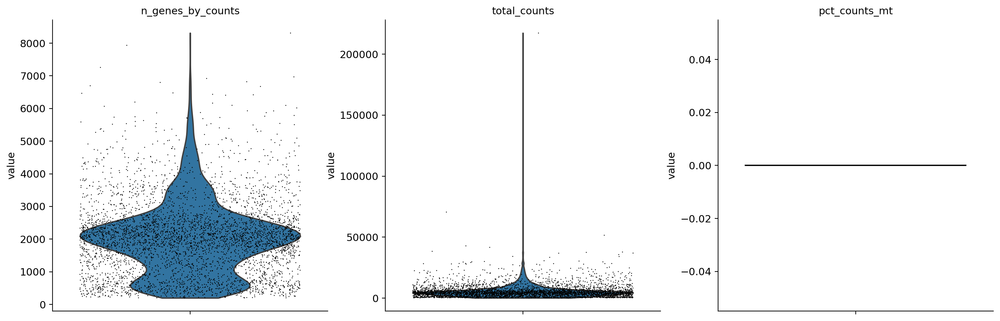

In [12]:
scp.pl.violin(lf, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save = 'cell_counts.pdf')

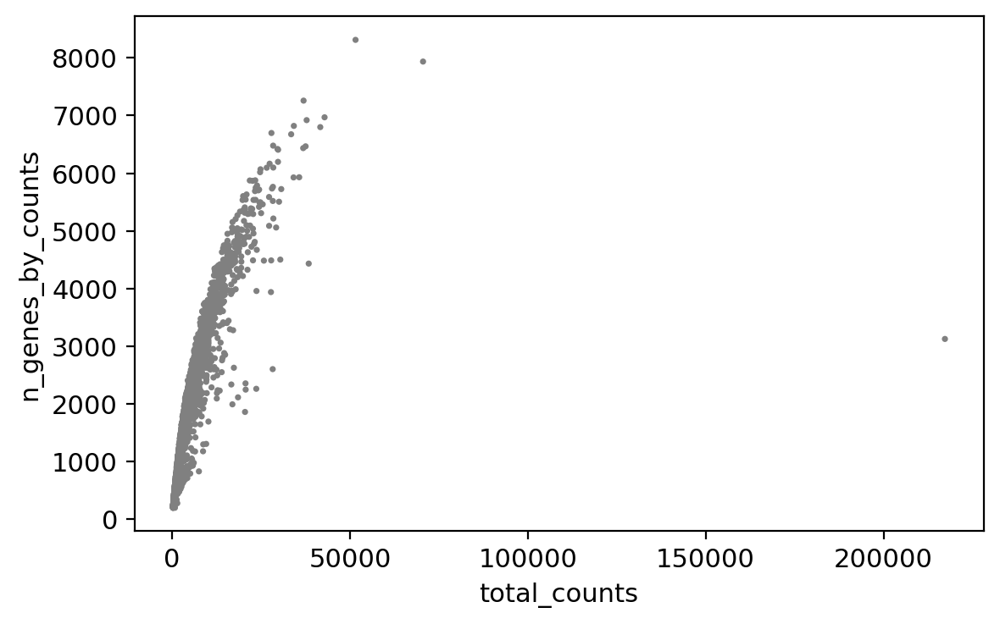

In [13]:
scp.pl.scatter(lf, x='total_counts', y='n_genes_by_counts')

In [14]:
lf = lf[lf.obs.n_genes_by_counts < 2500, :]
lf = lf[lf.obs.pct_counts_mt < 5, :]
lf

View of AnnData object with n_obs × n_vars = 3292 × 18448
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [15]:
print(lf.obs.index)
lf.obs['CellID'] = lf.obs.index
print(lf.obs)
print(lf.var.index)
lf.var['Gene'] = lf.var.index
print(lf.var)

Trying to set attribute `.obs` of view, copying.


Index(['SRR12545952:AACAAAGCATCATCCCx', 'SRR12545952:AAACGAAAGGACTTCTx',
       'SRR12545952:AAAGTCCCACCCTAAAx', 'SRR12545952:AAAGTCCTCTTGGATGx',
       'SRR12545952:AACCATGGTATAGGGCx', 'SRR12545952:AACCACACAGCTTTGAx',
       'SRR12545952:AACAGGGTCTGAATGCx', 'SRR12545952:AAAGAACTCGAGAATAx',
       'SRR12545952:AACAACCCACTGGATTx', 'SRR12545952:AACACACCACACTTAGx',
       ...
       'SRR12545952:TTGTTGTAGTTTGCTGx', 'SRR12545952:TTTGACTTCGCTAATGx',
       'SRR12545952:TTTACTGTCCGAGATTx', 'SRR12545952:TTTAGTCCAGATCCATx',
       'SRR12545952:TTTGATCGTTTACTTCx', 'SRR12545952:TTTGGTTGTTCGGCCAx',
       'SRR12545952:TTGTTGTAGTGCTACTx', 'SRR12545952:TTTCATGGTACCCAGCx',
       'SRR12545952:TTGTTTGTCCAGTGCGx', 'SRR12545952:TTTACCAAGATAACGTx'],
      dtype='object', length=3292)
                               Clusters         _X         _Y  n_genes  \
SRR12545952:AACAAAGCATCATCCCx         1 -13.831106   6.407388     2481   
SRR12545952:AAACGAAAGGACTTCTx         1 -14.909212   8.972316      697   
S

# SAVING FILTERED FILE

In [16]:
#file with all genes
cdata = lf
cdata.write_loom("filtered_data_cluster.loom", write_obsm_varm=True)

In [17]:
lf

AnnData object with n_obs × n_vars = 3292 × 18448
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [18]:
#basic preprocessing of data
scv.pp.filter_and_normalize(lf,n_top_genes=2000)
scv.pp.neighbors(lf)
scv.pp.moments(lf, n_neighbors=30)

Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [19]:
scv.tl.velocity(lf)
scv.tl.velocity_graph(lf)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [20]:
scv.tl.umap(lf, n_components=2)
scv.tl.louvain(lf,resolution=1)

# READ RAW DATA AND CHECK EXPRESSION

In [21]:
ldata = scv.read_loom("filtered_data_cluster.loom", sparse=False)
ldata

AnnData object with n_obs × n_vars = 3292 × 18448
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'pct_counts_mt', 'total_counts', 'total_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mean_counts', 'mt', 'n_cells', 'n_cells_by_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [22]:
c = lf.obs['louvain']
ldata.obs['louvain'] = c

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


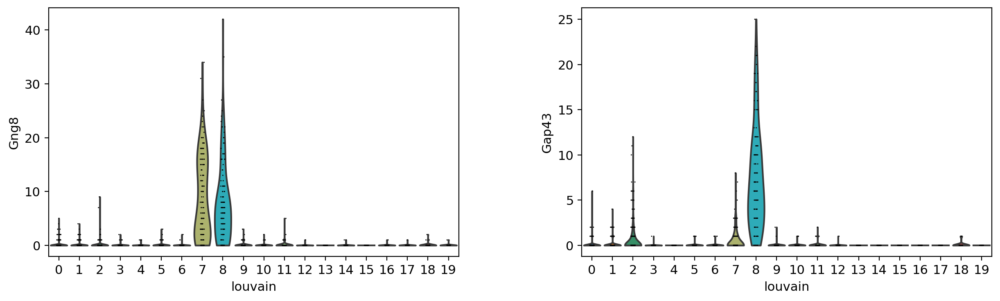

In [23]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Gng8","Gap43"]
scp.pl.violin(ldata, keys=immature_neuron_markers, groupby='louvain', save = 'immature_neurons_exp.pdf')

         Falling back to preprocessing with `sc.pp.pca` and default params.


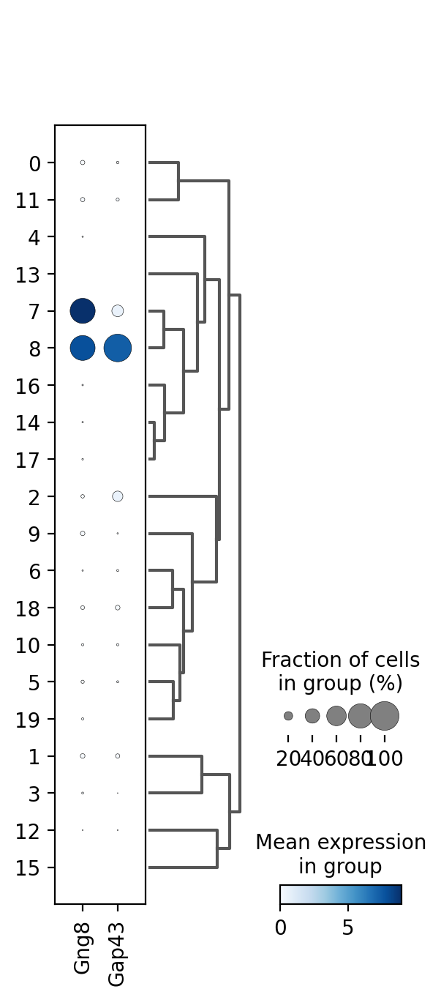

In [24]:
scp.pl.dotplot(ldata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-immature-exp.pdf')

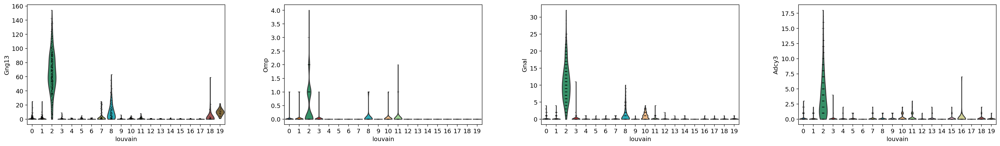

In [25]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Gng13","Omp","Gnal","Adcy3"]
scp.pl.violin(ldata, keys=mature_neuron_markers, groupby='louvain', save = 'mature-exp.pdf')

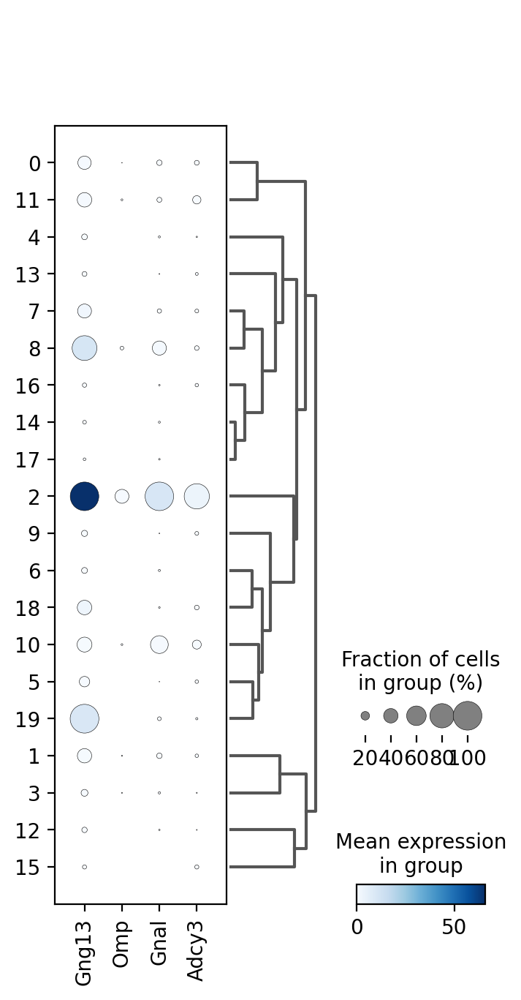

In [26]:
scp.pl.dotplot(ldata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-mature-exp.pdf')

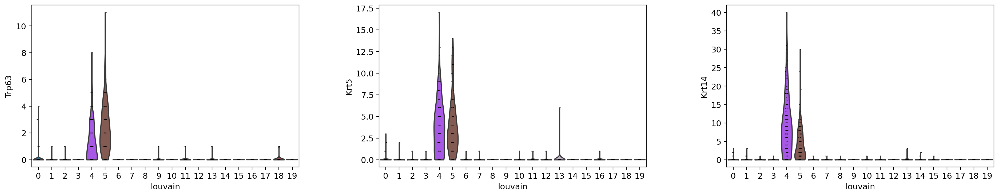

In [27]:
#HBC neuron markers to name the clusters on basis of stage
hbc_neuron_markers = ["Trp63", "Krt5", "Krt14"]
scp.pl.violin(ldata, keys=hbc_neuron_markers, groupby='louvain', save = 'hbc-exp.pdf')

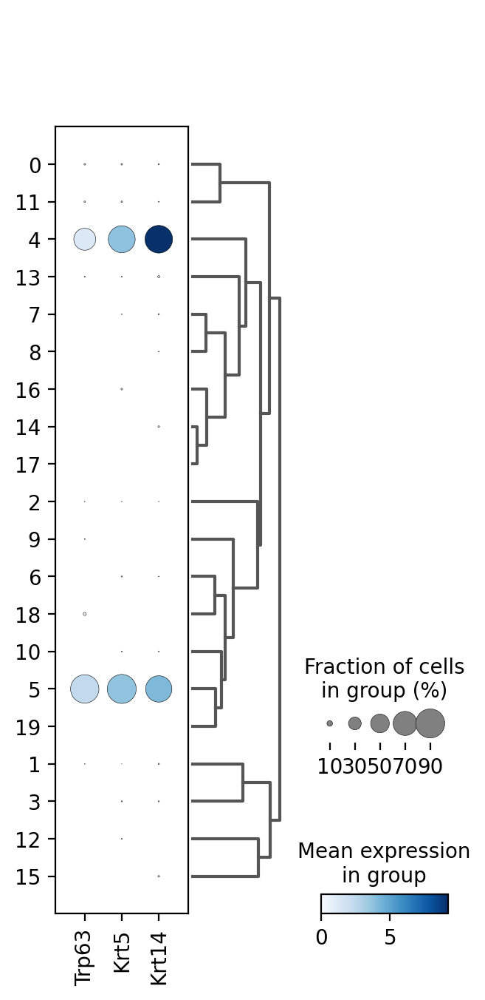

In [28]:
scp.pl.dotplot(ldata, hbc_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-hbc-exp.pdf')

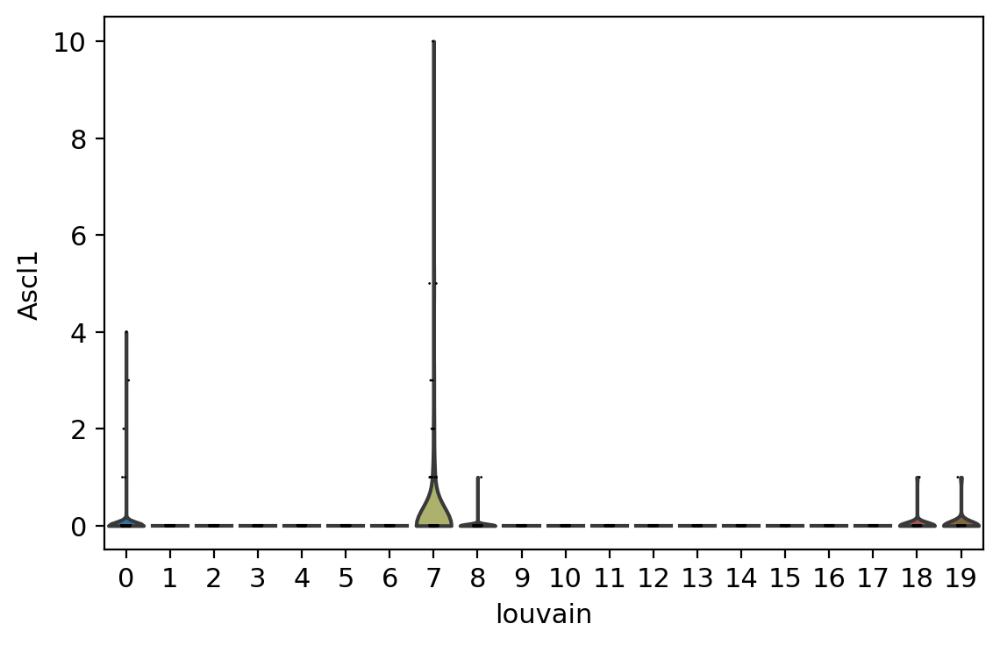

In [29]:
#GBC neuron markers to name the clusters on basis of stage
gbc_neuron_markers = ["Ascl1"]
scp.pl.violin(ldata, keys=gbc_neuron_markers, groupby='louvain', save = 'gbc-exp.pdf')

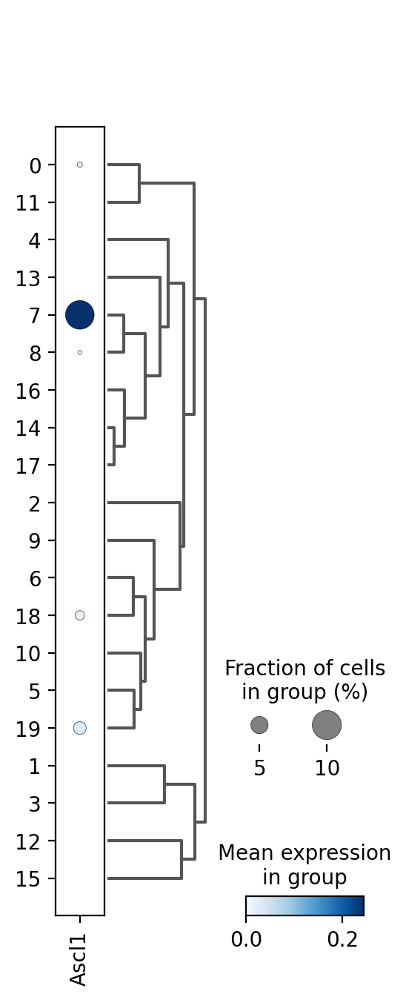

In [30]:
scp.pl.dotplot(ldata, gbc_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-gbc-exp.pdf')

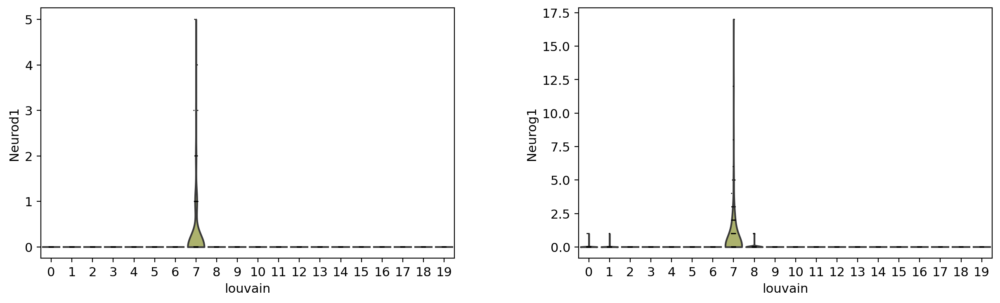

In [31]:
#Precusor neuron markers to name the clusters on basis of stage
prec_neuron_markers = ["Neurod1","Neurog1"]
scp.pl.violin(ldata, keys=prec_neuron_markers, groupby='louvain', save = 'prec-exp.pdf')

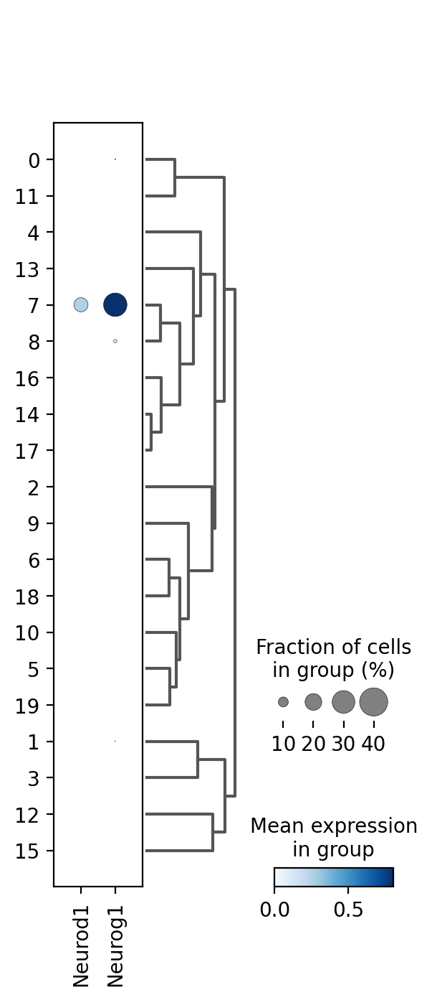

In [32]:
scp.pl.dotplot(ldata, prec_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-prec-exp.pdf')

In [33]:
%matplotlib inline
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params('scvelo',dpi_save=300)  # for beautified visualization
plt.rcParams['pdf.fonttype'] = 'truetype'

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_velocity-embedding.pdf


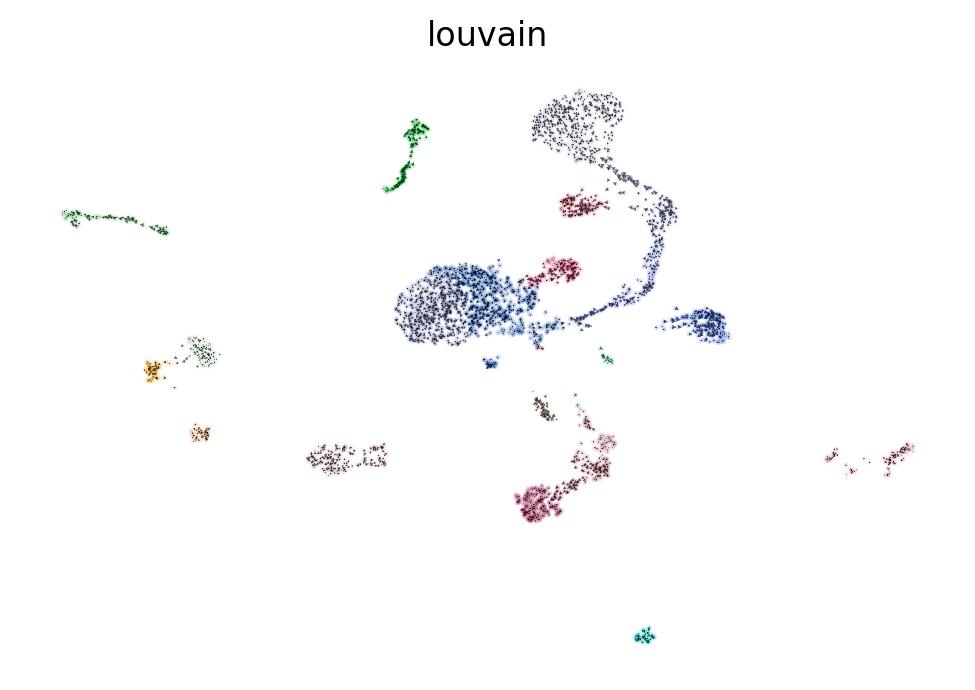

In [34]:
scv.pl.velocity_embedding(lf, basis = 'umap', color = 'louvain', save = 'velocity-embedding.pdf')

saving figure to file ./figures/scvelo_velocity-embedding-stream-steady.svg


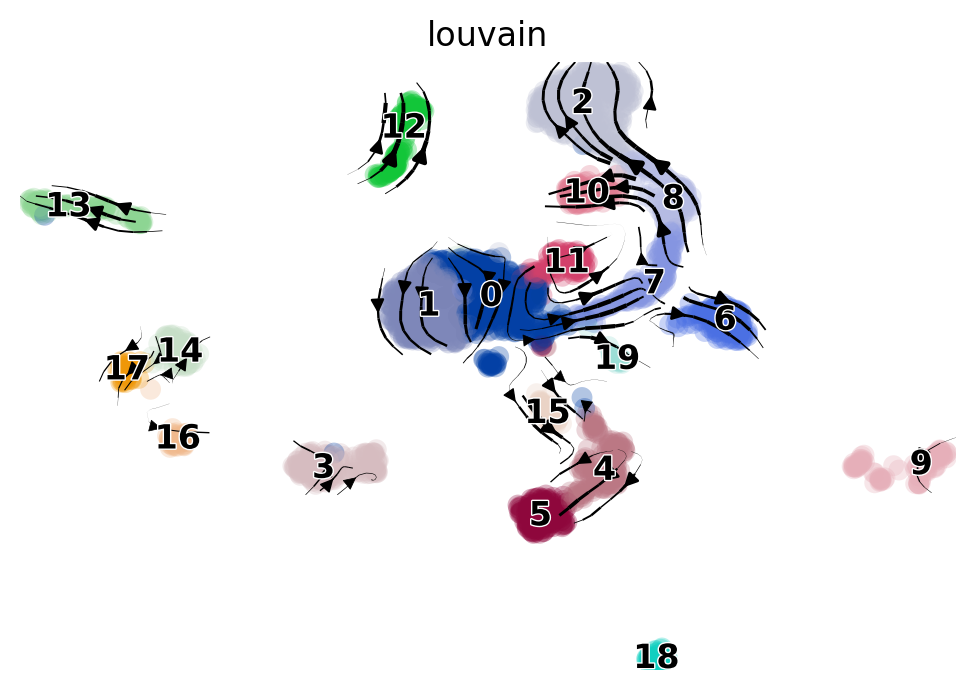

In [35]:
scv.pl.velocity_embedding_stream(lf, basis = 'umap', color = "louvain",save ='velocity-embedding-stream-steady.svg')

In [36]:
OR=pd.read_csv('expression.csv',index_col=0)


In [37]:
OR1=OR.T.filter(regex='^Olfr')
OR1

,Olfr1416,Olfr1415,Olfr1414,Olfr1413,Olfr1412,Olfr1411,Olfr1410,Olfr12,Olfr16,Olfr1408,...,Olfr1494,Olfr1495,Olfr1496,Olfr1497,Olfr1499,Olfr1500,Olfr1501,Olfr1502,Olfr1504,Olfr1505
AAACCCACACTTCAAG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACCCAGTTCTCAGA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACGAAAGGACTTCT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACGAACAATTGGTC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACGAACACCCTATC-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTATCAGGG-2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTTGGTCTGTCCT-2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTTGTCATAGCAC-2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTTGTCGATCCAA-2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
OR1=OR1.T.filter(regex="1$").T

In [39]:
bcodes=OR1.index

In [40]:
new_index=[]
for i in bcodes:
    new_index.append('SRR12545952:'+i.split('-')[0]+'x')

In [42]:
OR1.index=new_index

In [43]:
cf=lf.copy()
findex=cf.obs.index

In [45]:
ind=[]
for i in findex:
    if i in new_index:
        ind.append(i)

In [47]:
OR1=OR1.T[ind].T

In [48]:
cf=cf[cf.obs.T[ind].T.index]

In [49]:
cf.obs['OR_EXP'] = 'Not Expressed'

Trying to set attribute `.obs` of view, copying.


In [50]:
cf.obs['OR_EXP'][OR1.T.sum()>0]='Expressed'

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_OR_exp_all_cluster_markers.png


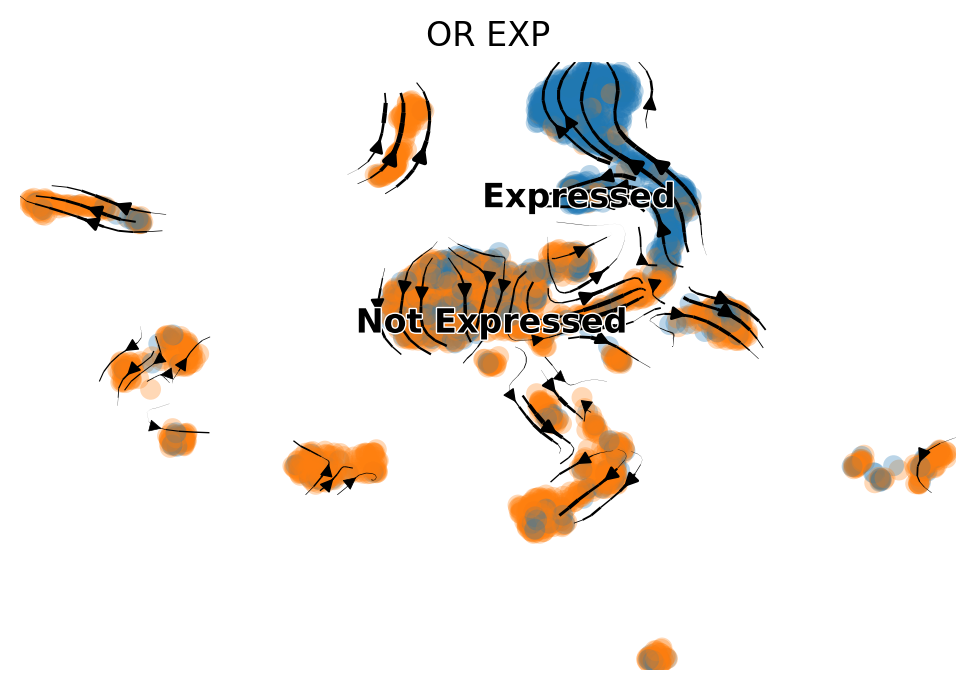

In [51]:
scv.pl.velocity_embedding_stream(cf, basis = 'umap', color = 'OR_EXP', save='OR_exp_all_cluster_markers.pdf')

In [52]:
markers = ["Lhx2","Gng8","Gap43","Gng13","Omp","Gnal","Ascl1","Neurog1","Neurod1","Adcy3"]

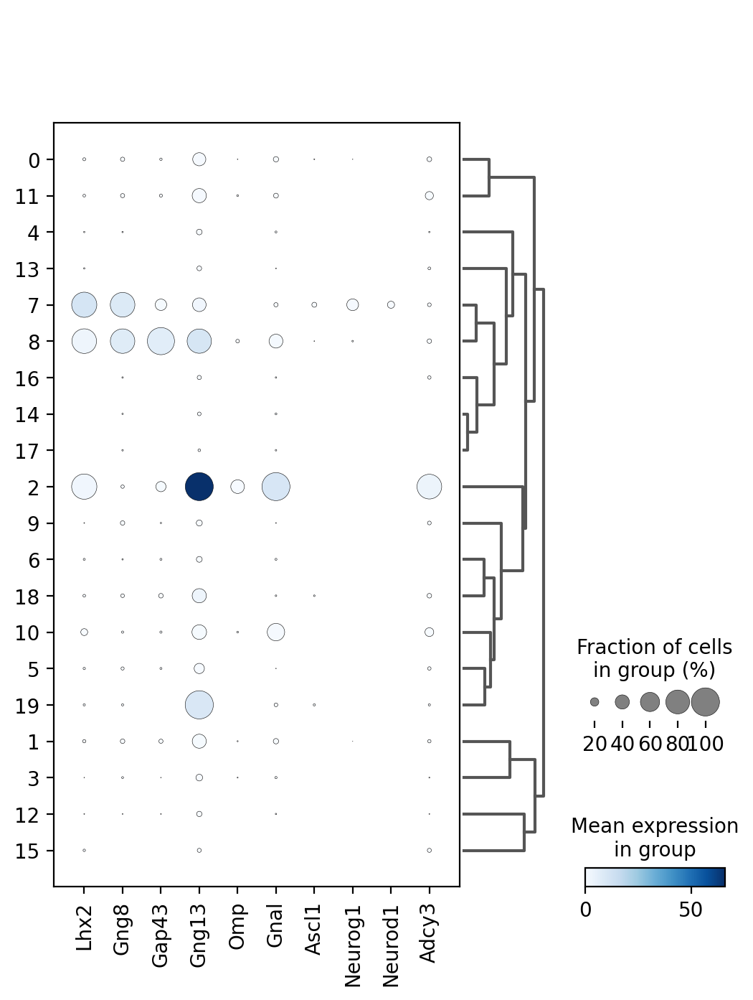

In [53]:
scp.pl.dotplot(ldata, markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot_all_cluster_markers.pdf')

In [54]:
mask= (lf.obs["louvain"]  == "2")|(lf.obs["louvain"]  == "8")|(lf.obs["louvain"]  == "7")|(lf.obs["louvain"]  == "5")|(lf.obs["louvain"]  == "4")
f=lf[mask].copy()

In [55]:
scv.pp.neighbors(f)
scv.pp.moments(f, n_neighbors=30)
scv.tl.velocity(f)
scv.tl.velocity_graph(f)
scv.tl.umap(f, n_components=2)
scv.tl.louvain(f,resolution=1)


computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res



    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


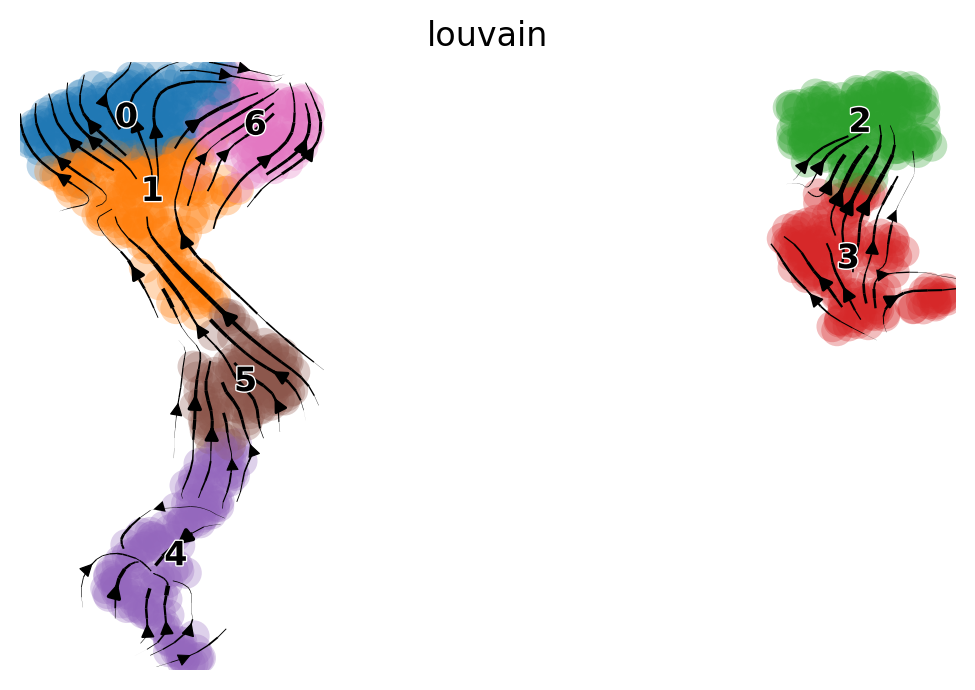

In [56]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = "louvain")

In [57]:
f

AnnData object with n_obs × n_vars = 1093 × 2000
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

In [109]:
f.obsm['X_umap']

array([[-2.6242633, 14.009588 ],
       [-4.9117427, 11.12624  ],
       [-5.950075 , -3.0978994],
       ...,
       [-3.2385352,  5.2550826],
       [-3.2262535, 12.686434 ],
       [-6.1525283, 13.362166 ]], dtype=float32)

In [58]:
cell = f.obs_names.tolist()
ddata = ldata[cell,:]

In [59]:
c = f.obs['louvain']
ddata.obs['louvains'] = c

Trying to set attribute `.obs` of view, copying.


In [60]:
ddata.obs

,Clusters,_X,_Y,n_genes,n_genes_by_counts,pct_counts_mt,total_counts,total_counts_mt,louvain,louvains
SRR12545952:AACAAAGCATCATCCCx,1,-13.831106,6.407388,2481,2480,0.0,5301.0,0.0,2,6
SRR12545952:AACCATGGTATAGGGCx,2,35.754475,9.587922,324,323,0.0,423.0,0.0,2,1
SRR12545952:AACCAACCATCTGTTTx,3,0.878934,-1.504111,1657,1656,0.0,2853.0,0.0,7,4
SRR12545952:AACAAGATCGACATACx,1,-11.502436,20.303062,1873,1872,0.0,3583.0,0.0,2,0
SRR12545952:AACCACACAGGACTTTx,3,12.800191,-6.639411,2233,2232,0.0,4394.0,0.0,2,6
...,...,...,...,...,...,...,...,...,...,...
SRR12545952:TTGTTGTAGTTTGCTGx,5,-4.858992,10.580984,2109,2107,0.0,4399.0,0.0,8,5
SRR12545952:TTTGACTTCGCTAATGx,5,-5.499418,14.536903,2243,2243,0.0,4914.0,0.0,2,1
SRR12545952:TTTGATCGTTTACTTCx,4,26.596981,-18.804325,2438,2438,0.0,5121.0,0.0,8,5
SRR12545952:TTGTTGTAGTGCTACTx,5,-4.362576,11.013078,2332,2332,0.0,5306.0,0.0,2,6


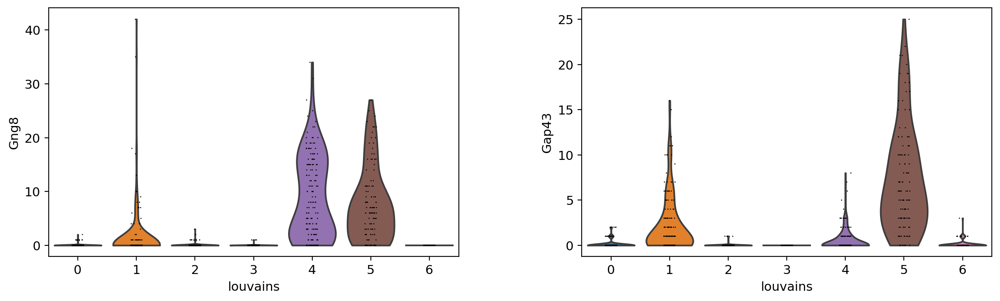

In [61]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Gng8","Gap43"]
scp.pl.violin(ddata, keys=immature_neuron_markers, groupby='louvains', save = 'immature_neurons_exp.pdf')

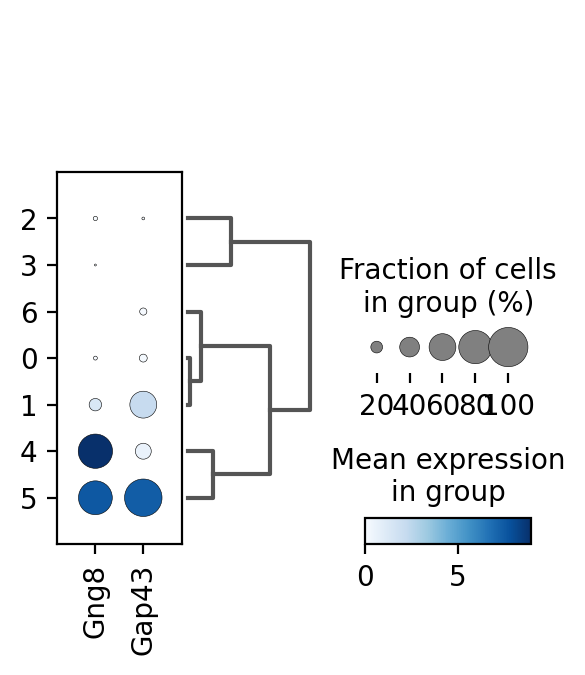

In [62]:
scp.pl.dotplot(ddata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-immature-exp.pdf')

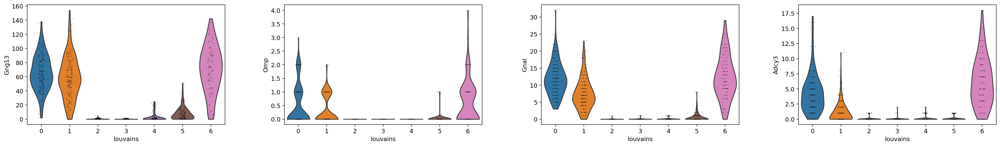

In [63]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Gng13","Omp","Gnal","Adcy3"]
scp.pl.violin(ddata, keys=mature_neuron_markers, groupby='louvains', save = 'mature-exp.pdf')

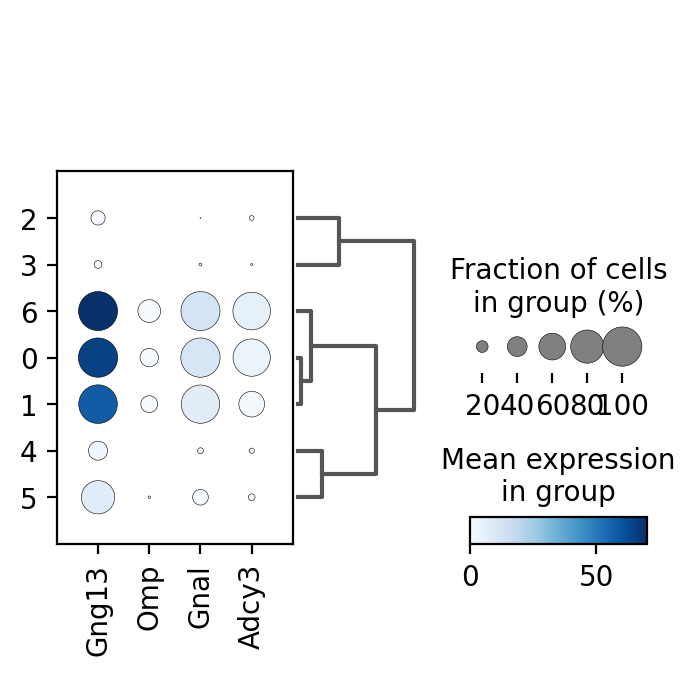

In [64]:
scp.pl.dotplot(ddata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-mature-exp.pdf')

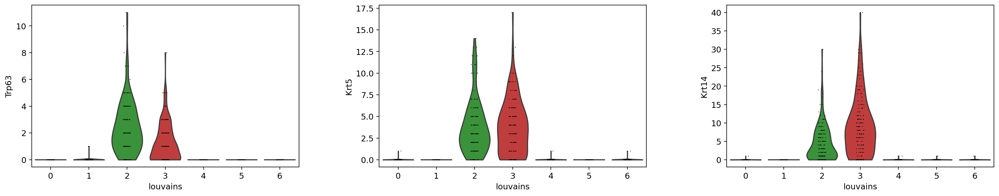

In [65]:
#HBC neuron markers to name the clusters on basis of stage
hbc_neuron_markers = ["Trp63", "Krt5", "Krt14"]
scp.pl.violin(ddata, keys=hbc_neuron_markers, groupby='louvains', save = 'hbc-exp.pdf')

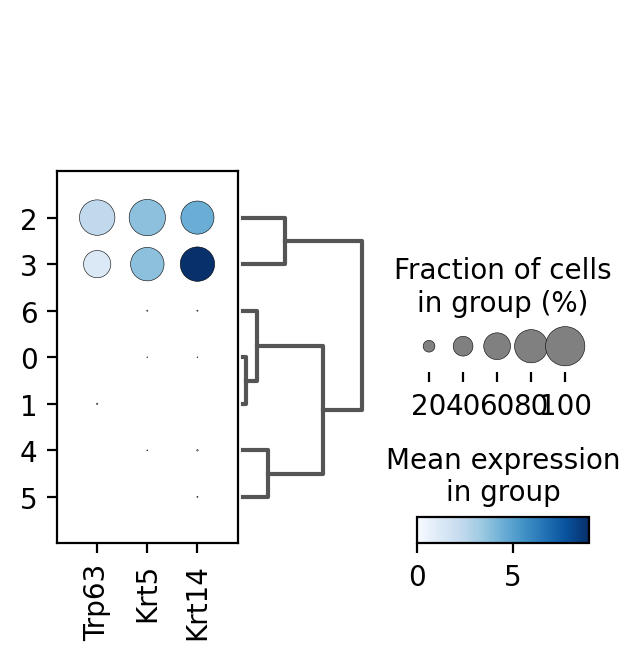

In [66]:
scp.pl.dotplot(ddata, hbc_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-hbc-exp.pdf')

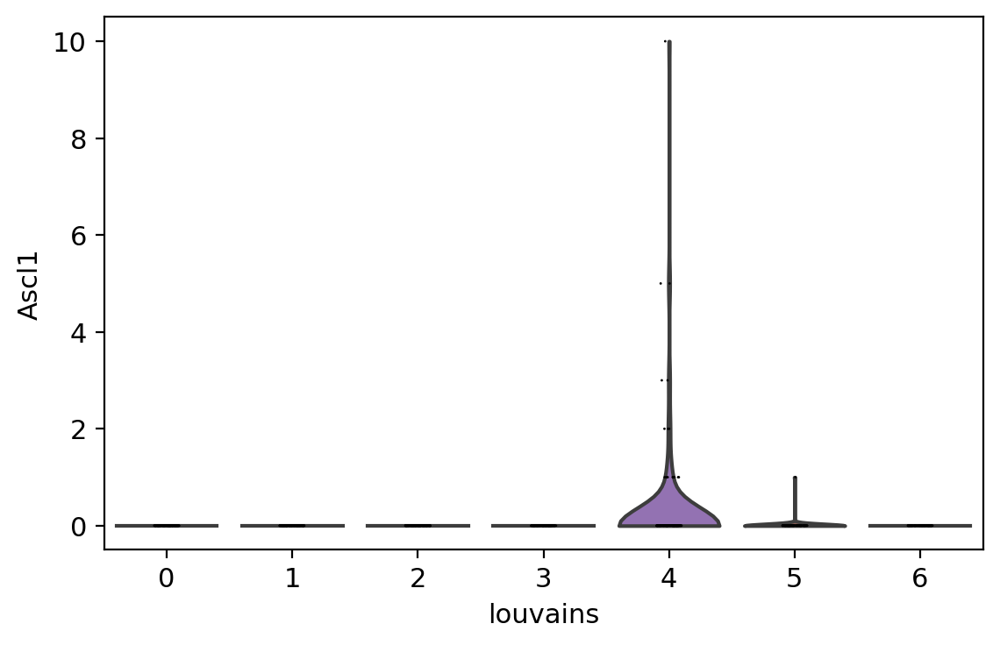

In [67]:
#GBC neuron markers to name the clusters on basis of stage
gbc_neuron_markers = ["Ascl1"]
scp.pl.violin(ddata, keys=gbc_neuron_markers, groupby='louvains', save = 'gbc-exp.pdf')

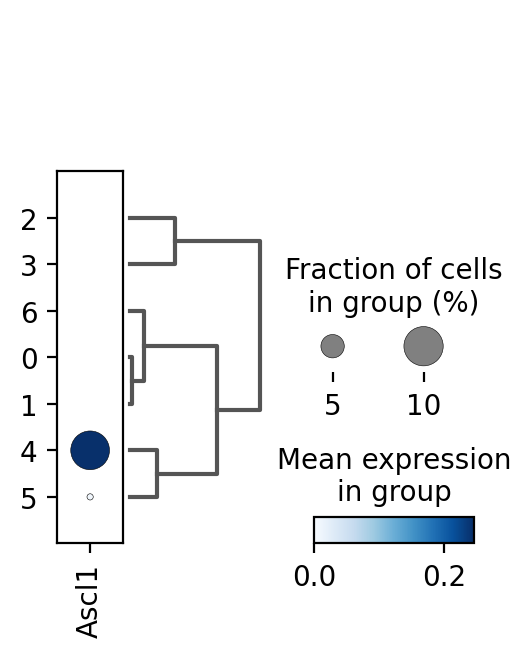

In [68]:
scp.pl.dotplot(ddata, gbc_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-gbc-exp.pdf')

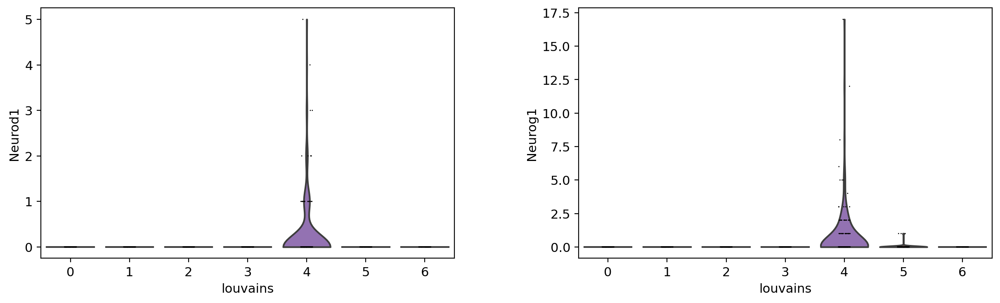

In [69]:
#Precusor neuron markers to name the clusters on basis of stage
prec_neuron_markers = ["Neurod1","Neurog1"]
scp.pl.violin(ddata, keys=prec_neuron_markers, groupby='louvains', save = 'prec-exp.pdf')

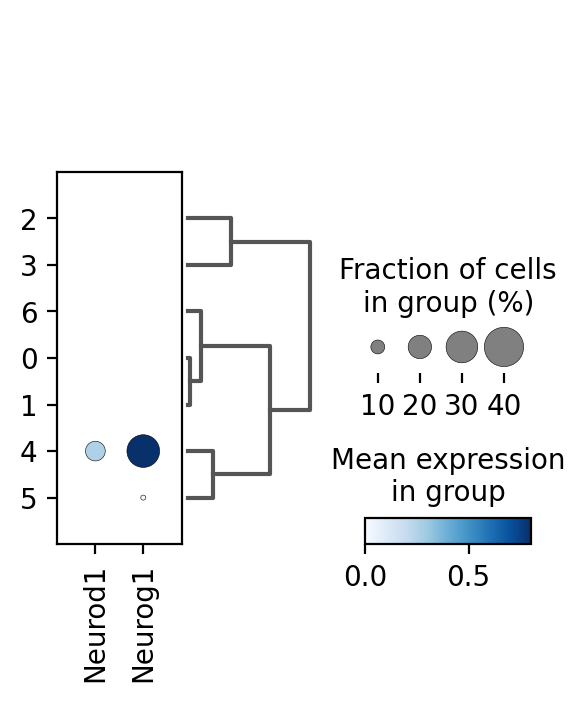

In [70]:
scp.pl.dotplot(ddata, prec_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-prec-exp.pdf')

In [71]:
markers = ["Lhx2","Gng8","Gap43","Gng13","Omp","Gnal","Adcy3","Ascl1","Neurog1","Neurod1","Trp63", "Krt5","Krt14"]

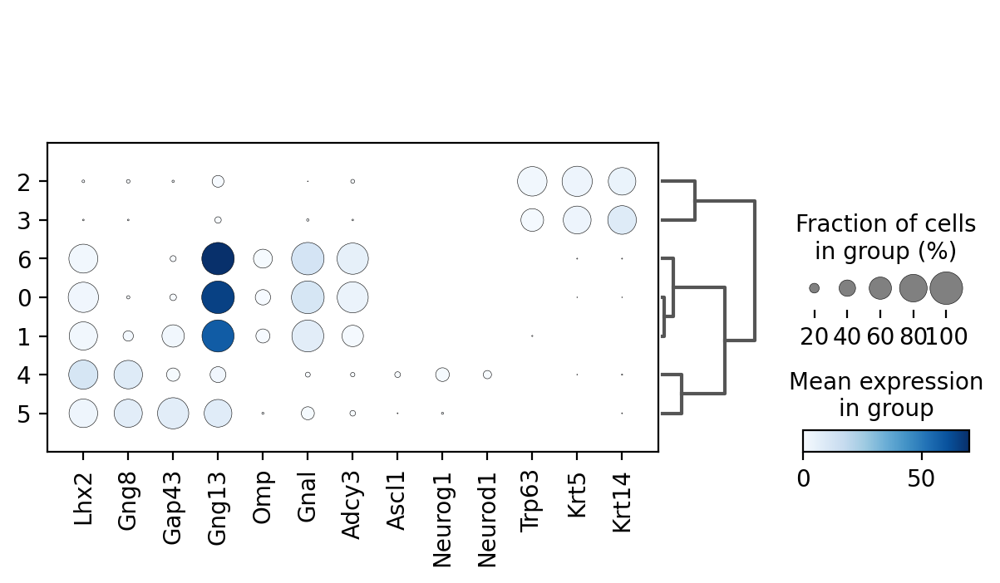

In [72]:
scp.pl.dotplot(ddata, markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot_all_markers.pdf')

In [73]:
mask= (f.obs["louvain"]  == "4")
GBC_immature=f[mask].copy()

In [74]:
scv.pp.neighbors(GBC_immature)
scv.pp.moments(GBC_immature, n_neighbors=30)
scv.tl.velocity(GBC_immature)
scv.tl.velocity_graph(GBC_immature)
scv.tl.umap(GBC_immature, n_components=2)
scv.tl.louvain(GBC_immature,resolution=1)


computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res



    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


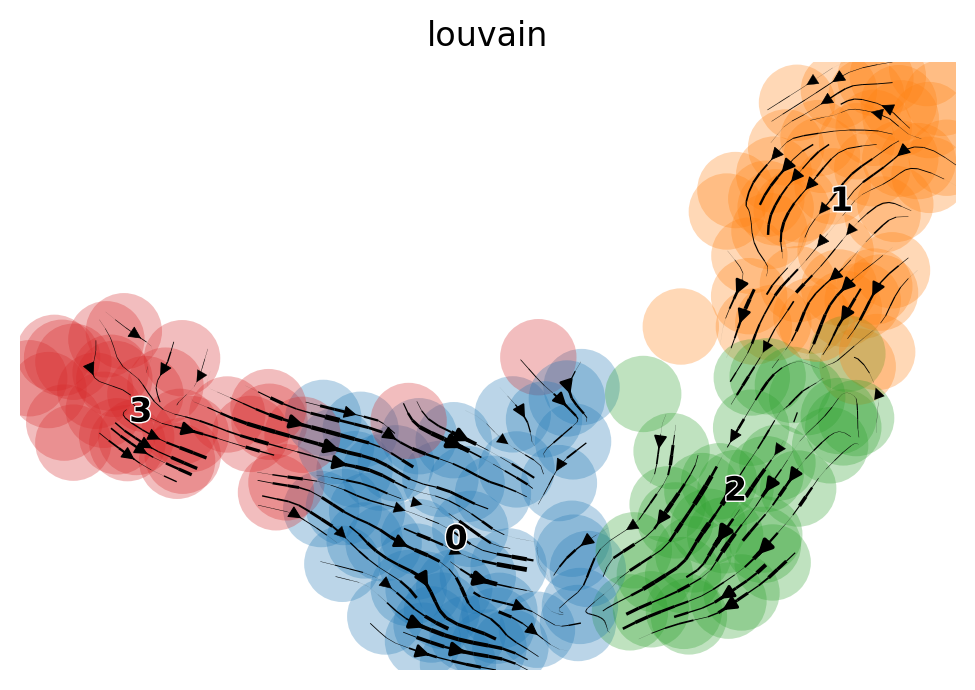

In [75]:
scv.pl.velocity_embedding_stream(GBC_immature, basis = 'umap', color = "louvain")

In [76]:
cell = GBC_immature.obs_names.tolist()
fdata = ddata[cell,:]

In [77]:
c = GBC_immature.obs['louvain']
fdata.obs['louvainss'] = c

Trying to set attribute `.obs` of view, copying.


In [78]:
GBC_immature.obs

,Clusters,_X,_Y,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,CellID,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,louvain
SRR12545952:AACCAACCATCTGTTTx,3,0.878934,-1.504111,1657,1656,2853.0,0.0,0.0,SRR12545952:AACCAACCATCTGTTTx,2853,3014,2853.0,3555.000244,0.166509,0
SRR12545952:AACCATGAGAGCCGTAx,0,-10.169810,37.807087,2425,2425,5727.0,0.0,0.0,SRR12545952:AACCATGAGAGCCGTAx,5727,1478,5727.0,3555.000000,0.164426,3
SRR12545952:AACCTGACACGAAAGCx,2,8.195257,-14.084932,1865,1864,4297.0,0.0,0.0,SRR12545952:AACCTGACACGAAAGCx,4297,1524,4297.0,3554.999756,0.332353,3
SRR12545952:AACAAAGAGCGTTCATx,6,-17.317999,33.163223,2091,2090,4826.0,0.0,0.0,SRR12545952:AACAAAGAGCGTTCATx,4826,1311,4826.0,3555.000000,0.094228,0
SRR12545952:AAGACAAGTTTCCAAGx,7,-6.764256,-24.793789,1671,1671,3507.0,0.0,0.0,SRR12545952:AAGACAAGTTTCCAAGx,3507,996,3507.0,3555.000000,0.292352,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR12545952:TTCTAACAGCGTTAGGx,5,-12.390326,19.791048,1384,1384,2724.0,0.0,0.0,SRR12545952:TTCTAACAGCGTTAGGx,2724,916,2724.0,3555.000000,0.222784,1
SRR12545952:TTGTTCATCCGGACGTx,10,-35.979965,-0.169356,741,741,961.0,0.0,0.0,SRR12545952:TTGTTCATCCGGACGTx,961,1011,961.0,3555.000244,0.292646,3
SRR12545952:TTTGATCAGCACTCATx,1,-13.389290,-5.268437,506,505,617.0,0.0,0.0,SRR12545952:TTTGATCAGCACTCATx,617,454,617.0,3554.999512,0.159214,3
SRR12545952:TTTGGAGGTGGCTTGCx,1,-21.463739,-5.472812,2498,2496,6188.0,0.0,0.0,SRR12545952:TTTGGAGGTGGCTTGCx,6188,2112,6188.0,3555.000000,0.262244,3


In [79]:
markers = ["Ascl1","Neurog1","Neurod1", "Lhx2","Gng8",]

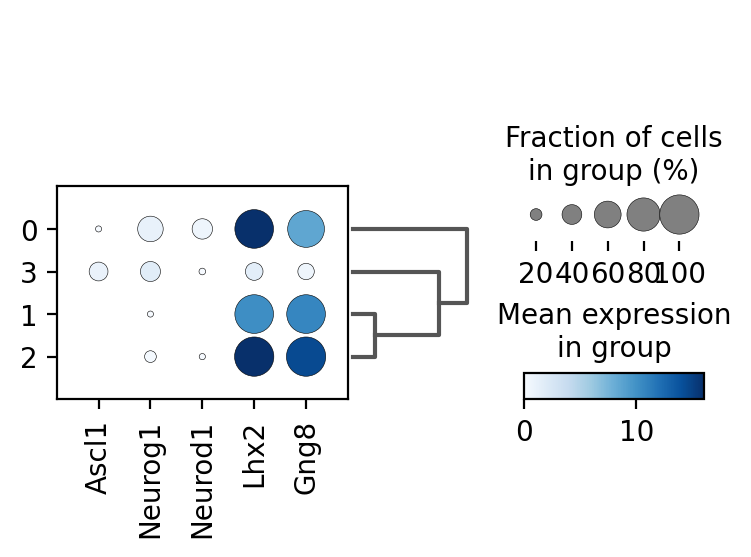

In [80]:
scp.pl.dotplot(fdata, markers,dendrogram=True, cmap='Blues', groupby='louvainss')

In [84]:
GBC_immature.obs['celltype'] = 'Immature cells'
GBC_immature.obs['celltype'][GBC_immature.obs['louvain']=='0'] = 'Pecursor cells'
GBC_immature.obs['celltype'][GBC_immature.obs['louvain']=='3'] = 'GBC cells'

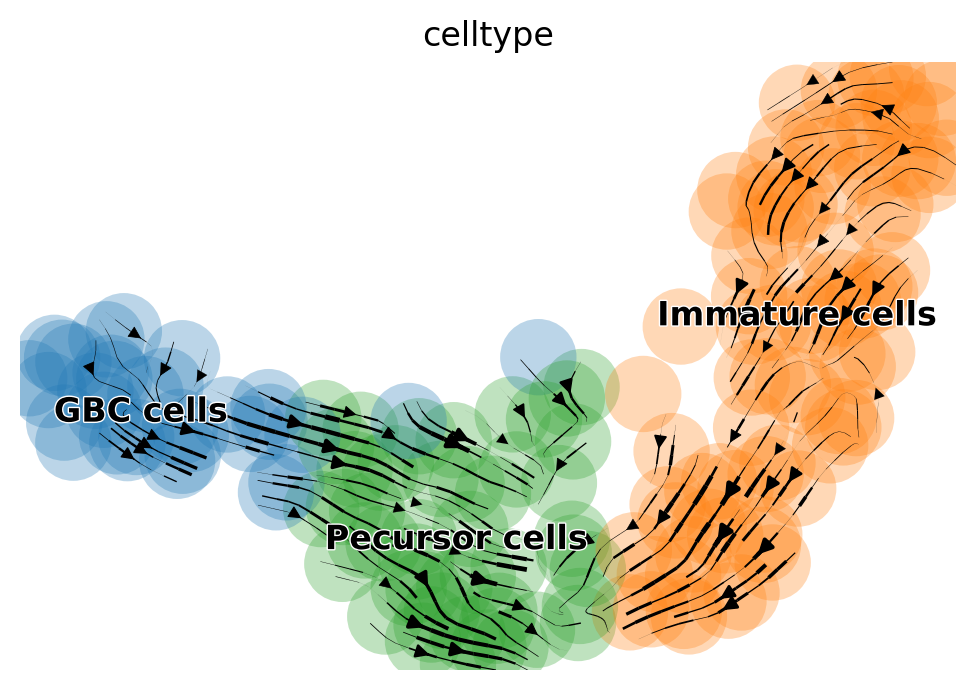

In [85]:
scv.pl.velocity_embedding_stream(GBC_immature, basis = 'umap', color = "celltype")

In [86]:
mask= (f.obs["louvain"]  == "1")
mat_immat=f[mask].copy()

In [87]:
scv.pp.neighbors(mat_immat)
scv.pp.moments(mat_immat, n_neighbors=30)
scv.tl.velocity(mat_immat)
scv.tl.velocity_graph(mat_immat)
scv.tl.umap(mat_immat, n_components=2)
scv.tl.louvain(mat_immat,resolution=1)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res



    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


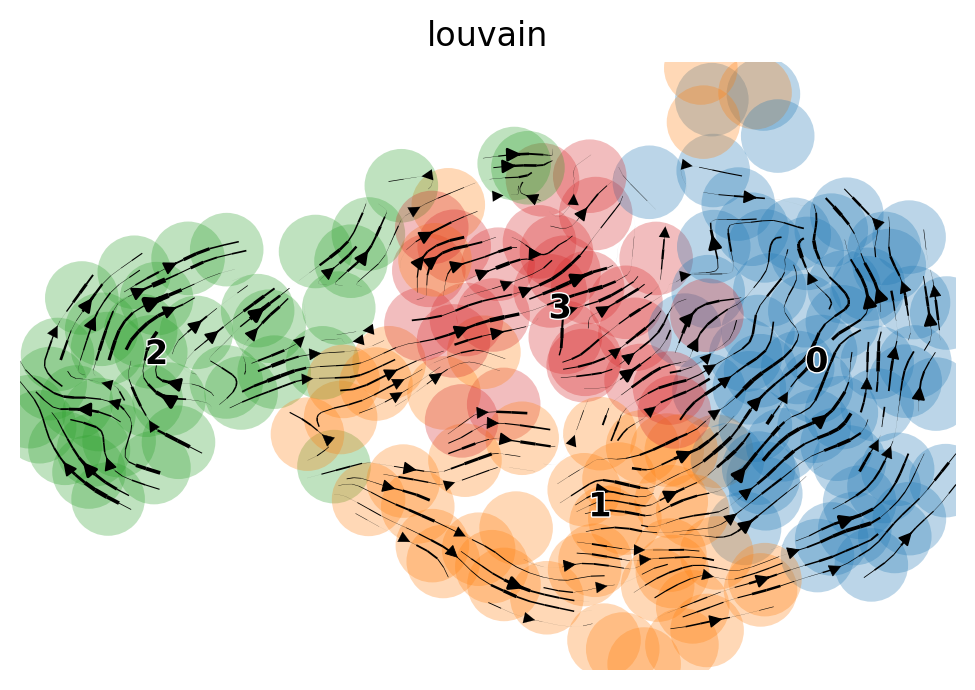

In [88]:
scv.pl.velocity_embedding_stream(mat_immat, basis = 'umap', color = "louvain")

In [89]:
cell = mat_immat.obs_names.tolist()
mdata = ddata[cell,:]

In [90]:
c = mat_immat.obs['louvain']
mdata.obs['louvainss'] = c

Trying to set attribute `.obs` of view, copying.


In [91]:
markers =  ["Lhx2","Gng8","Gap43","Gng13","Omp","Gnal","Adcy3"]

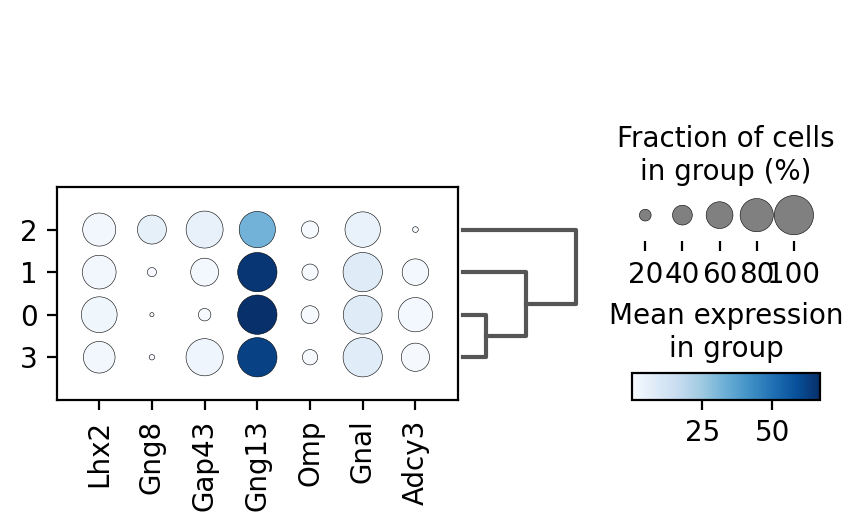

In [92]:
scp.pl.dotplot(mdata, markers,dendrogram=True, cmap='Blues', groupby='louvainss')

In [93]:
mat_immat.obs['celltype'] = 'Mature cells'
mat_immat.obs['celltype'][mat_immat.obs['louvain']=='2'] = 'Transition cells'

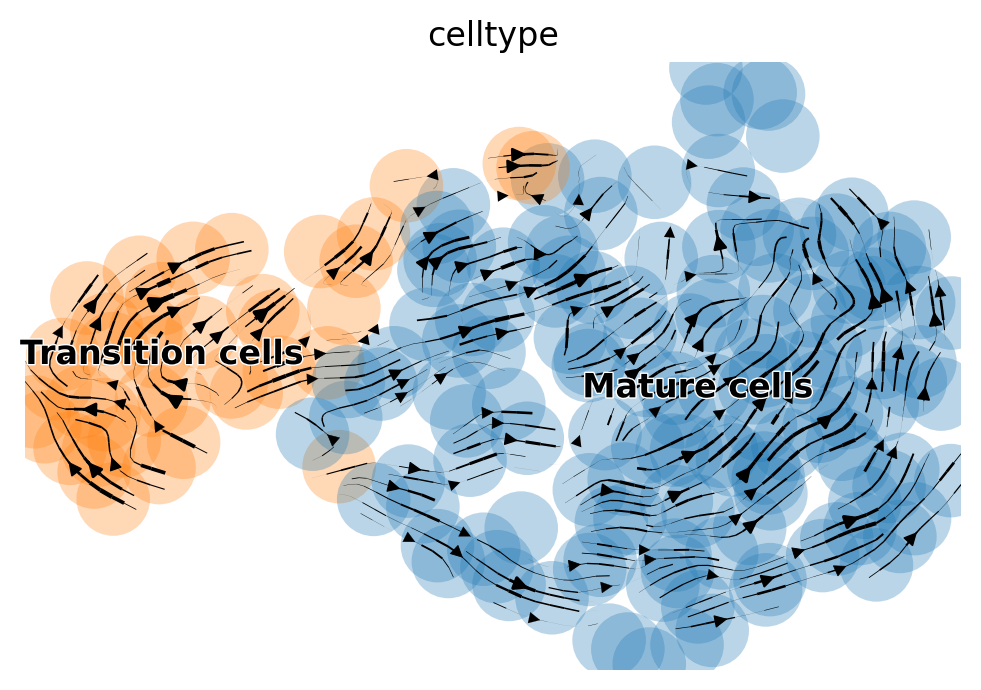

In [94]:
scv.pl.velocity_embedding_stream(mat_immat, basis = 'umap', color = "celltype")

Final cluster names

In [95]:
f.obs['celltype'] = 'Mature cells'
tr_cs=GBC_immature.obs[GBC_immature.obs['celltype']=='Pecursor cells']['CellID'].tolist()
f.obs['celltype'][tr_cs]='Pecursor cells'
tr_cs=GBC_immature.obs[GBC_immature.obs['celltype']=='GBC cells']['CellID'].tolist()
f.obs['celltype'][tr_cs]='GBC cells'
tr_cs=GBC_immature.obs[GBC_immature.obs['celltype']=='Immature cells']['CellID'].tolist()
f.obs['celltype'][tr_cs]='Immature cells'
tr_cs=mat_immat.obs[mat_immat.obs['celltype']=='Mature cells']['CellID'].tolist()
f.obs['celltype'][tr_cs]='Mature cells'
tr_cs=mat_immat.obs[mat_immat.obs['celltype']=='Transition cells']['CellID'].tolist()
f.obs['celltype'][tr_cs]='Transition cells'
f.obs['celltype'][f.obs['louvain']=='3'] = 'HBC cells'
f.obs['celltype'][f.obs['louvain']=='2'] = 'HBC cells'
f.obs['celltype'][f.obs['louvain']=='5'] = 'Immature cells'

saving figure to file ./figures/scvelo_san_velocity_embedding_stream.svg


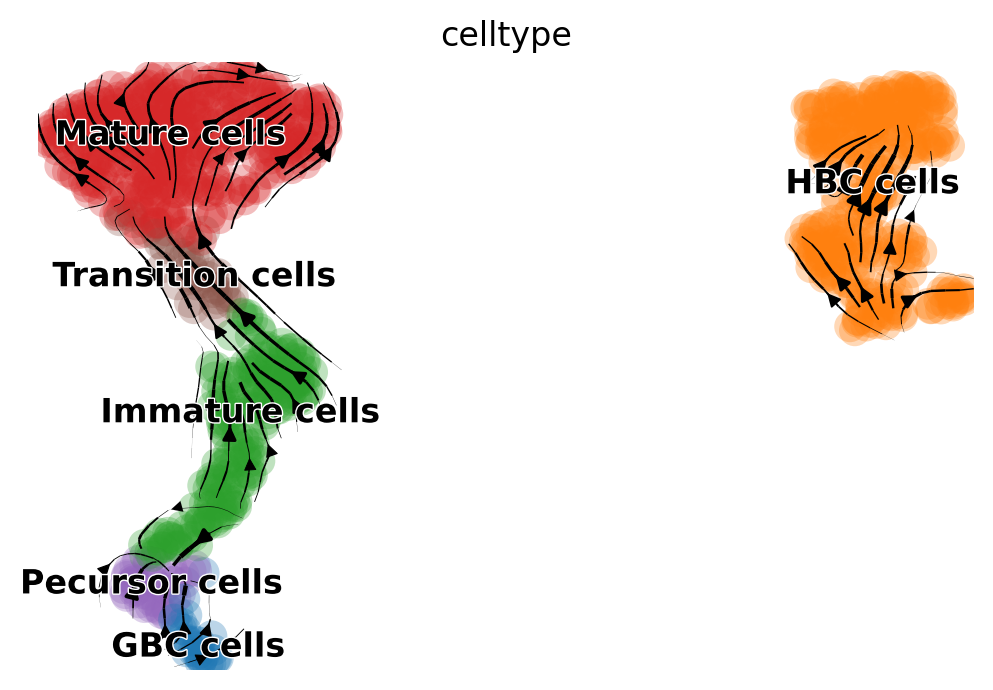

In [96]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = 'celltype',save= 'san_velocity_embedding_stream.svg')

In [97]:
cpf=f.copy()
findex=cpf.obs.index

In [98]:
ind=[]
for i in findex:
    if i in new_index:
        ind.append(i)

In [99]:
cpf=cpf[cpf.obs.T[ind].T.index]
OR1=OR1.T[ind].T

In [100]:
cpf.obs['OR_EXP'] = 'Not Expressed'
cpf.obs['OR_EXP'][OR1.T.sum()>0]='Expressed'

Trying to set attribute `.obs` of view, copying.


saving figure to file ./figures/scvelo_OR_exp_all_cluster_markers.svg


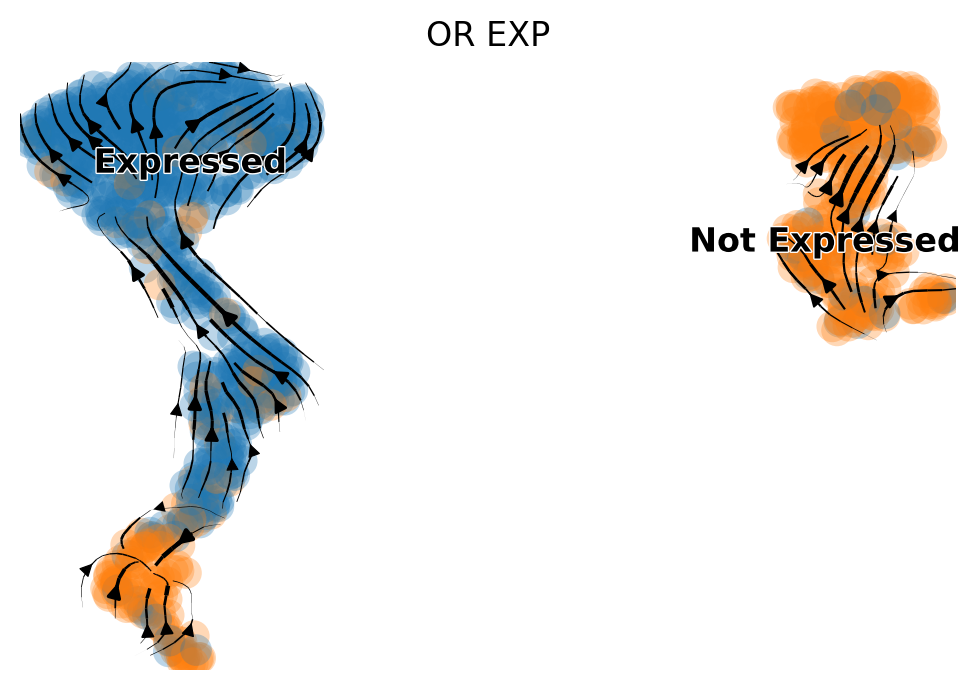

In [101]:
scv.pl.velocity_embedding_stream(cpf, basis = 'umap', color = 'OR_EXP', save='OR_exp_all_cluster_markers.svg')

In [102]:
k = f.obs['celltype']
ddata.obs['celltype'] = k

In [103]:
markers = ["Lhx2","Gng8","Gap43","Gng13","Omp","Gnal","Adcy3","Ascl1","Neurog1","Neurod1","Trp63", "Krt5","Krt14"]

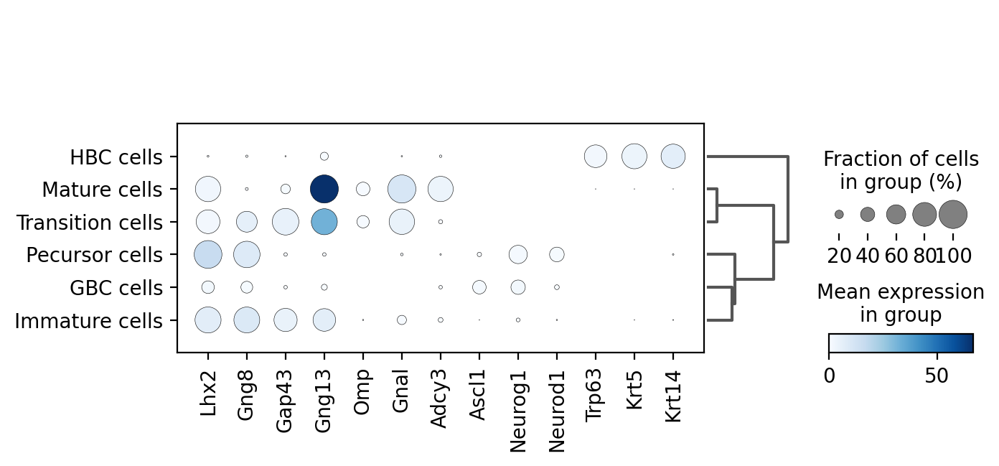

In [104]:
scp.pl.dotplot(ddata, markers,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot_all_markers.pdf')

In [105]:
# CLUSTER SEGREGATION TO FIND THEIR IDENTITY IN R

In [106]:
#subsetting immature cells
clus = (f.obs["celltype"]  == "Immature cells")
clus1 = f[clus].copy()
clus1_ind = clus1.obs_names
clus1_list = clus1_ind.to_list()
clust1 = ddata[clus1_list, :]

#extracting umap coordinates
umap1 = clus1.obsm['X_umap']
umap1 = pd.DataFrame(umap1)
umap1.index = clus1.obs_names
umap1.to_csv('umapimmat.csv')

In [107]:
#subsetting transition cells
clus = (f.obs["celltype"]  == "Transition cells")
clus0 = f[clus].copy()
clus0_ind = clus0.obs_names
clus0_list = clus0_ind.to_list()
#clus0_list = [sub[ : -2] for sub in clus0_ind]
clust0 = ddata[clus0_list, :]

#extracting umap coordinates
umap0 = clus0.obsm['X_umap']
umap0 = pd.DataFrame(umap0)
umap0.index = clus0.obs_names
umap0.to_csv('umaptrans.csv')

In [108]:
#subsetting mature cells
clus = (f.obs["celltype"]  == "Mature cells")
clus4 = f[clus].copy()
clus4_ind = clus4.obs_names
clus4_list = clus4_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust4 = ddata[clus4_list, :]

#extracting umap coordinates
umap4 = clus4.obsm['X_umap']
umap4 = pd.DataFrame(umap4)
umap4.index = clus4.obs_names
umap4.to_csv('umapmature.csv')

In [109]:
#subsetting GBC cells
clus = (f.obs["celltype"]  == "GBC cells")
clus5 = f[clus].copy()
clus5_ind = clus5.obs_names
clus5_list = clus5_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust5 = ddata[clus5_list, :]

#extracting umap coordinates
umap5 = clus5.obsm['X_umap']
umap5 = pd.DataFrame(umap5)
umap5.index = clus5.obs_names
umap5.to_csv('umapgbc.csv')

In [110]:
#subsetting HBC cells
clus = (f.obs["celltype"]  == "HBC cells")
clus6 = f[clus].copy()
clus6_ind = clus6.obs_names
clus6_list = clus6_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust6 = ldata[clus6_list, :]

#extracting umap coordinates
umap6 = clus6.obsm['X_umap']
umap6 = pd.DataFrame(umap6)
umap6.index = clus6.obs_names
umap6.to_csv('umaphbc.csv')

In [111]:
#subsetting HBC cells
clus = (f.obs["celltype"]  == "Pecursor cells")
clus7 = f[clus].copy()
clus7_ind = clus7.obs_names
clus7_list = clus7_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust7 = ddata[clus7_list, :]

#extracting umap coordinates
umap7 = clus7.obsm['X_umap']
umap7 = pd.DataFrame(umap7)
umap7.index = clus7.obs_names
umap7.to_csv('umapprec.csv')

# Downstream analysis
IMPORTANT GENES

In [112]:
#file with all genes
ddata = f
ddata.write_loom("downstream.loom", write_obsm_varm=True)

In [113]:
scv.tl.rank_velocity_genes(f, groupby='celltype', min_corr=.3)
df = scv.DataFrame(f.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,GBC cells,HBC cells,Immature cells,Mature cells,Pecursor cells,Transition cells
0,Garnl3,Pde7a,Cpsf6,Mmp16,Dnase2a,Ebf4
1,Nnat,Apoe,Rtn1,Cacnb2,Casr,Ptpdc1
2,Smoc2,Rbms3,Pcolce2,Kctd16,Runx1t1,Ccdc39
3,Cxcl14,Sema5a,Apba2,Rnf150,Plpp3,Olfr1321
4,Slc43a1,Nr4a2,Runx1t1,Cfap100,Cep250,2610037D02Rik


In [114]:
df.to_csv('rank_velocity_genes_wild.csv')

saving figure to file ./figures/scvelo_scatterplot_Immature_cells.pdf


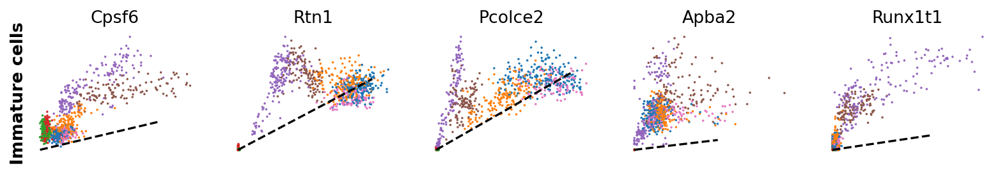

saving figure to file ./figures/scvelo_scatterplot_mature_cells.pdf


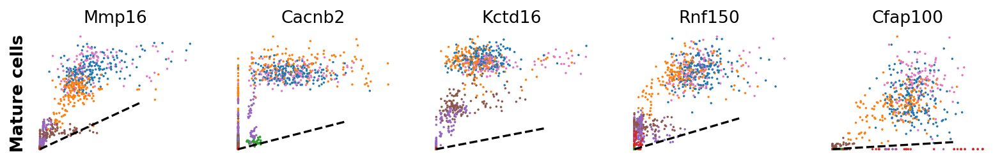

saving figure to file ./figures/scvelo_scatterplot_transition_cells.pdf


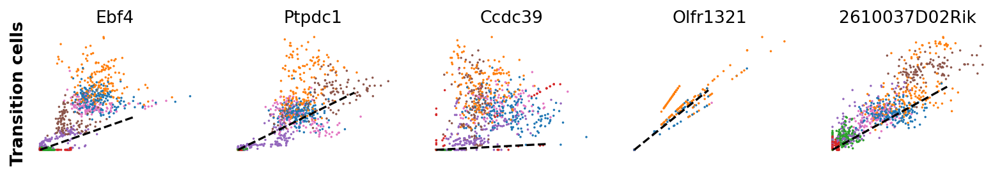

saving figure to file ./figures/scvelo_scatterplot_Pecursor_cells.pdf


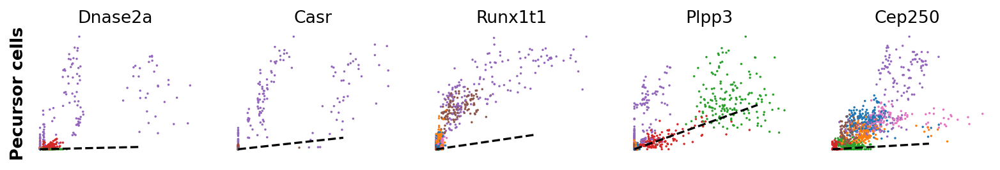

saving figure to file ./figures/scvelo_scatterplot_HBC_cells.pdf


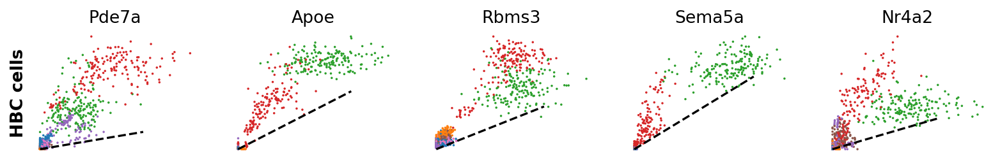

saving figure to file ./figures/scvelo_scatterplot_GBC_cells.pdf


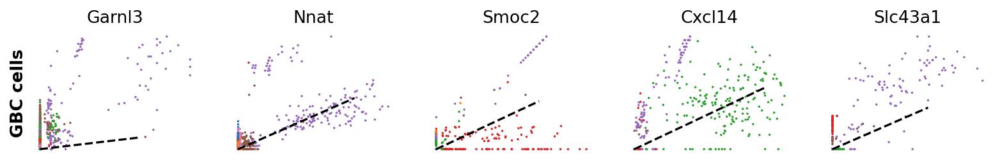

In [115]:
#Expressions of velocity genes
kwargs = dict(frameon=False, size=10, linewidth=1.5)

scv.pl.scatter(f, df['Immature cells'][:5], ylabel='Immature cells', **kwargs, save = 'scatterplot_Immature_cells.pdf')
scv.pl.scatter(f, df['Mature cells'][:5], ylabel='Mature cells', **kwargs, save = 'scatterplot_mature_cells.pdf')
scv.pl.scatter(f, df['Transition cells'][:5], ylabel='Transition cells', **kwargs, save = 'scatterplot_transition_cells.pdf')
scv.pl.scatter(f, df['Pecursor cells'][:5], ylabel='Pecursor cells', **kwargs, save = 'scatterplot_Pecursor_cells.pdf')
scv.pl.scatter(f, df['HBC cells'][:5], ylabel='HBC cells', **kwargs, save = 'scatterplot_HBC_cells.pdf')
scv.pl.scatter(f, df['GBC cells'][:5], ylabel='GBC cells', **kwargs, save = 'scatterplot_GBC_cells.pdf')


VELOCITIES IN CYCLING PROGENITOR

In [116]:
scv.utils.get_phase_marker_genes(f)

(array([], dtype=float64), array([], dtype=float64))

saving figure to file ./figures/scvelo_Velocitygraph_All_cell.pdf


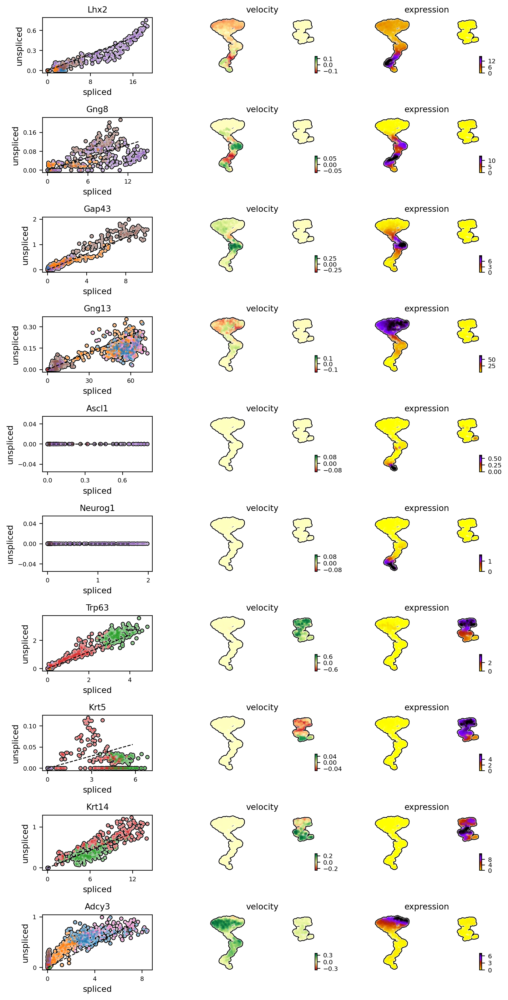

In [117]:
scv.pl.velocity(f, ["Lhx2","Gng8","Gap43","Gng13","Omp","Gnal","Ascl1","Neurog1","Neurod1","Trp63", "Krt5","Krt14","Adcy3"], add_outline=True, save= 'Velocitygraph_All_cell.pdf')

SPEED AND COHERENCE

In [118]:
f

AnnData object with n_obs × n_vars = 1093 × 2000
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors', 'celltype_colors', 'rank_velocity_genes'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 

In [119]:
scv.tl.velocity_confidence(f)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


saving figure to file ./figures/scvelo_speed_and_coherence.pdf


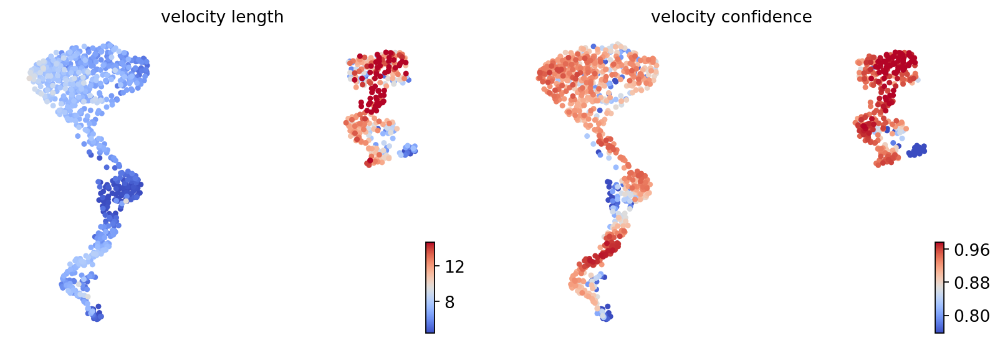

In [120]:
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(f, c=keys, cmap='coolwarm', perc=[5, 95], color = 'celltype', save = 'speed_and_coherence.pdf')

In [121]:
df = f.obs.groupby('celltype')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

celltype,GBC cells,HBC cells,Immature cells,Mature cells,Pecursor cells,Transition cells
velocity_length,5.830313,11.409020,5.647538,7.151553,6.590833,6.954103
velocity_confidence,0.803329,0.920413,0.893896,0.902187,0.882639,0.912732


In [122]:
df.to_csv('velocity_data.csv')

VELOCITY GRAPH AND PSEUDOTIME

saving figure to file ./figures/scvelo_Velocity_graph.pdf


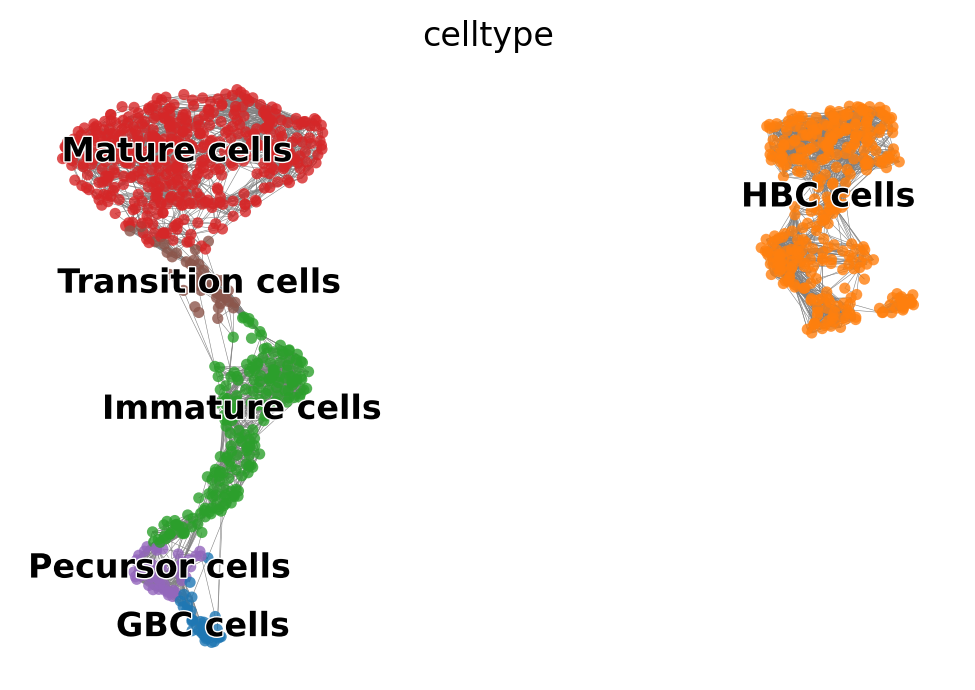

In [123]:
scv.pl.velocity_graph(f, threshold=.1, color='celltype', save = 'Velocity_graph.pdf')

saving figure to file ./figures/scvelo_descendants-ancestor-cell.pdf


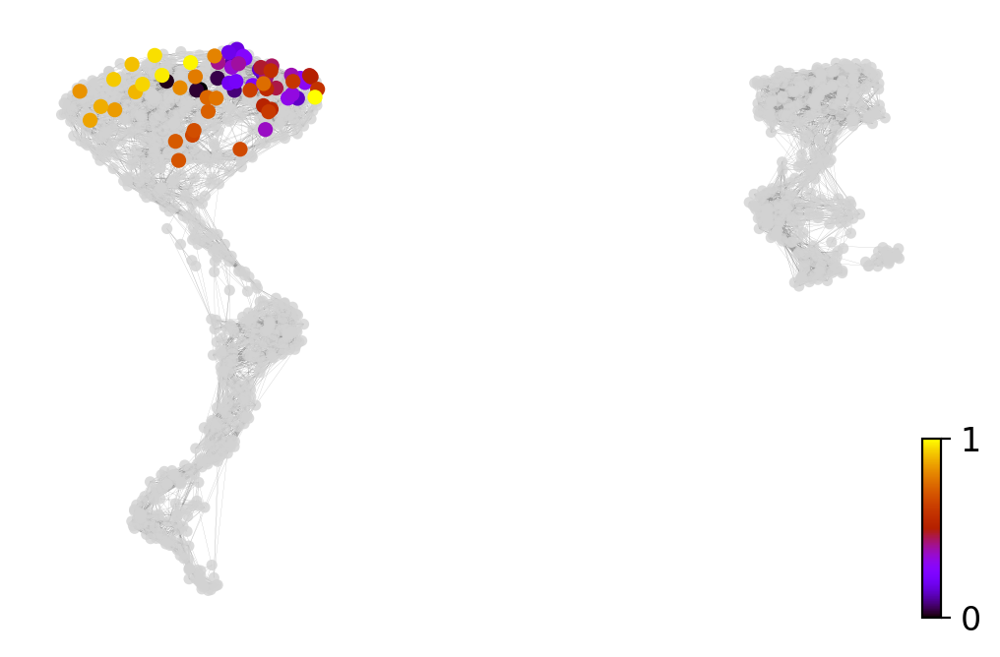

In [124]:
x, y = scv.utils.get_cell_transitions(f, basis='umap', starting_cell= 100)
ax = scv.pl.velocity_graph(f, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(f, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax, save='descendants-ancestor-cell.pdf')

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_pseudotime.pdf


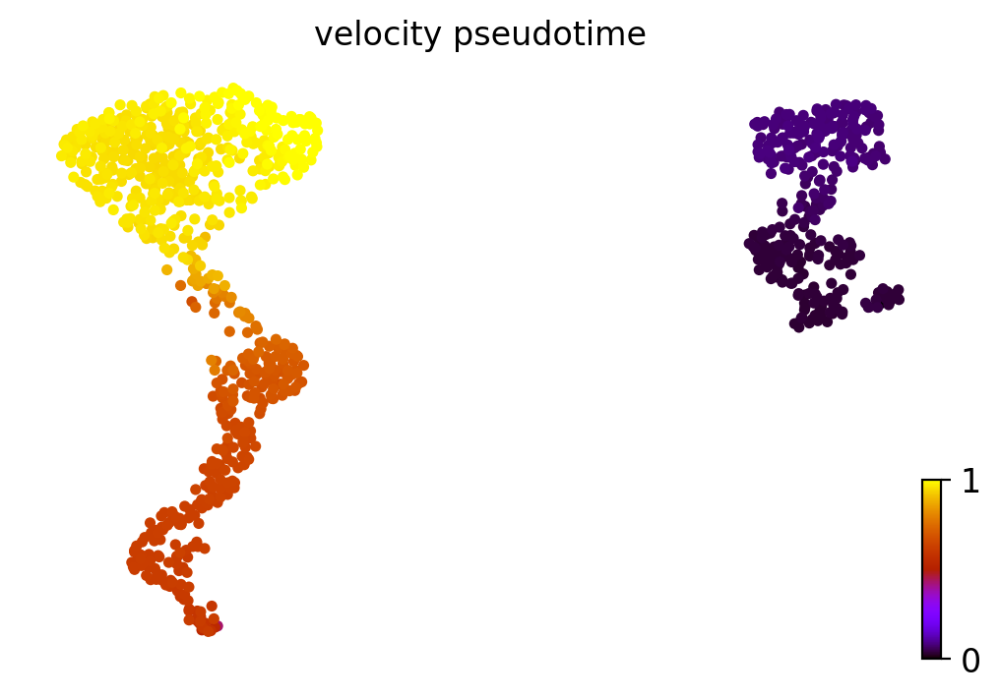

In [125]:
scv.tl.velocity_pseudotime(f)
scv.pl.scatter(f, color='velocity_pseudotime', cmap='gnuplot', save = 'pseudotime.pdf')

In [126]:
len(f.obs['velocity_pseudotime'].tolist())

1093

In [127]:
f.obs.to_csv('Wild_all_velocity_pseudotime.csv')

PAGA VELOCITY GRAPH

In [128]:
f.uns['neighbors']['distances'] = f.obsp['distances']
f.uns['neighbors']['connectivities'] = f.obsp['connectivities']
scv.tl.paga(f, groups='celltype')
df = scv.get_df(f, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,GBC cells,HBC cells,Immature cells,Mature cells,Pecursor cells,Transition cells
GBC cells,0,0,0.45,0,0.29,0
HBC cells,0,0,0,0,0,0
Immature cells,0,0,0,0,0,0.14
Mature cells,0,0,0,0,0,0
Pecursor cells,0,0,0,0,0,0
Transition cells,0,0,0,0.14,0,0


saving figure to file ./figures/scvelo_PAGA.pdf


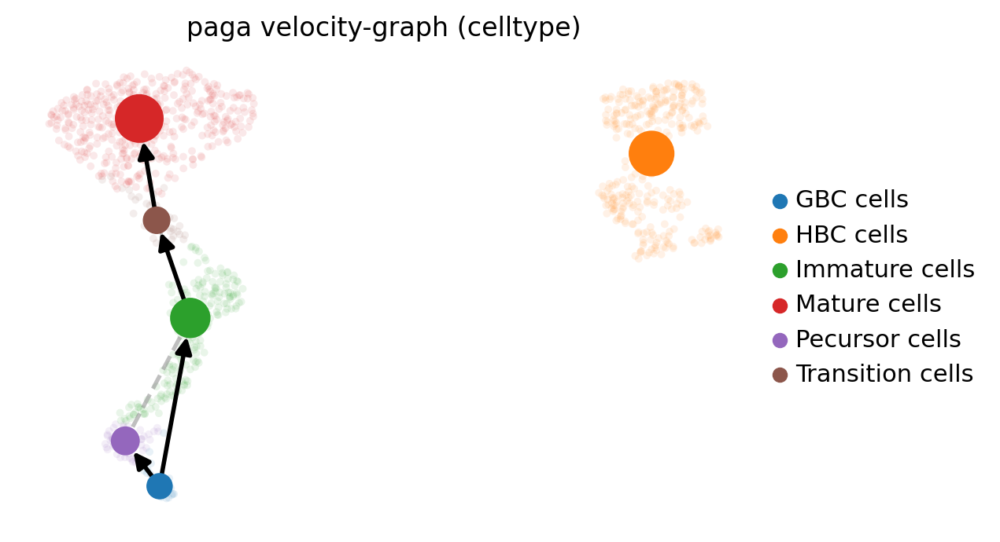

In [129]:
scv.pl.paga(f, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save = 'PAGA.pdf')

# Dynamical modeling

In [130]:
scv.tl.recover_dynamics(f)

recovering dynamics (using 1/20 cores)



    finished (0:02:52) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [131]:
scv.tl.velocity(f, mode='dynamical')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_differential_velocity_stream.svg


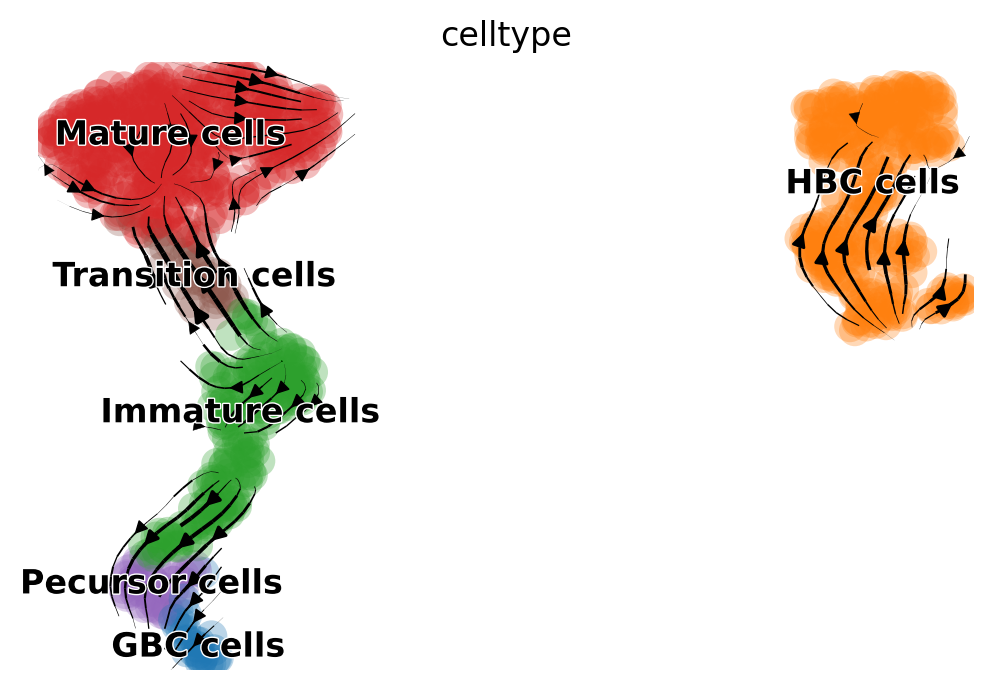

In [132]:
scv.pl.velocity_embedding_stream(f, basis='umap', color = 'celltype', save = 'differential_velocity_stream.svg')

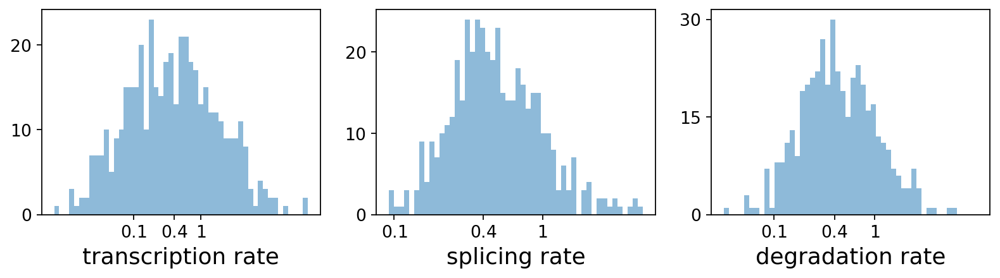

/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_anndata.py:311: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Mybl1,1.25,1.61,0.92,5.60,0.28,0.26,0.43,0.41,0.0,0.0,0.48,0.74,1.11,0.19,1.00,0.95
Col5a2,0.07,0.45,0.49,3.55,4.25,0.07,0.03,0.32,0.0,0.0,0.06,0.18,0.08,0.45,0.90,0.30
Pard3bos2,0.08,0.81,0.40,5.31,0.89,0.04,0.05,0.22,0.0,0.0,0.21,0.10,0.15,1.10,1.69,0.53
Fn1,0.09,1.20,0.23,5.42,0.44,0.02,0.07,0.37,0.0,0.0,0.37,0.05,0.22,0.24,2.83,0.09
Cfap65,0.17,1.29,0.27,15.52,0.52,0.04,0.11,0.19,0.0,0.0,0.48,0.10,0.66,0.53,2.31,0.16


In [133]:
df = f.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]
kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate',xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)
    plt.savefig('trans-spl-deg.pdf')

scv.get_df(f, 'fit*', dropna=True).head()

In [134]:
df.to_csv('trans-spli-degr-wild.csv')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_Latent_time.pdf


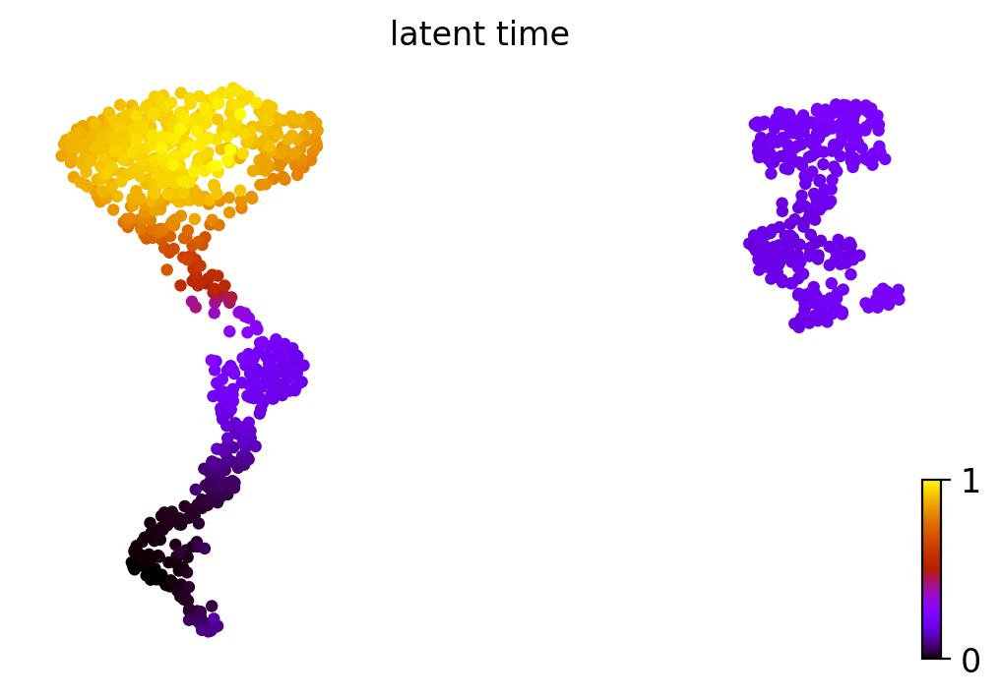

In [135]:
scv.tl.latent_time(f)
scv.pl.scatter(f, color='latent_time', color_map='gnuplot', size=80, save = 'Latent_time.pdf')

saving figure to file ./figures/scvelo_heatmap_Toplikelihoodgenes_heatmap.pdf


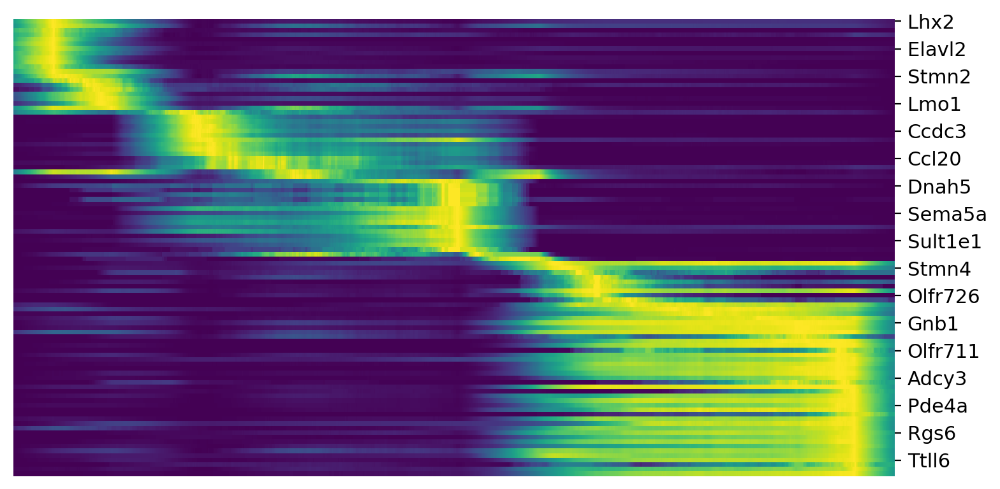

In [136]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.pl.heatmap(f, var_names=top_genes, sortby='latent_time', n_convolve=100, save = 'Toplikelihoodgenes_heatmap.pdf')

TOP LIKELIHOOD GENES - DRIVER GENES

saving figure to file ./figures/scvelo_toplikelihood-15genes_scatterplot.pdf


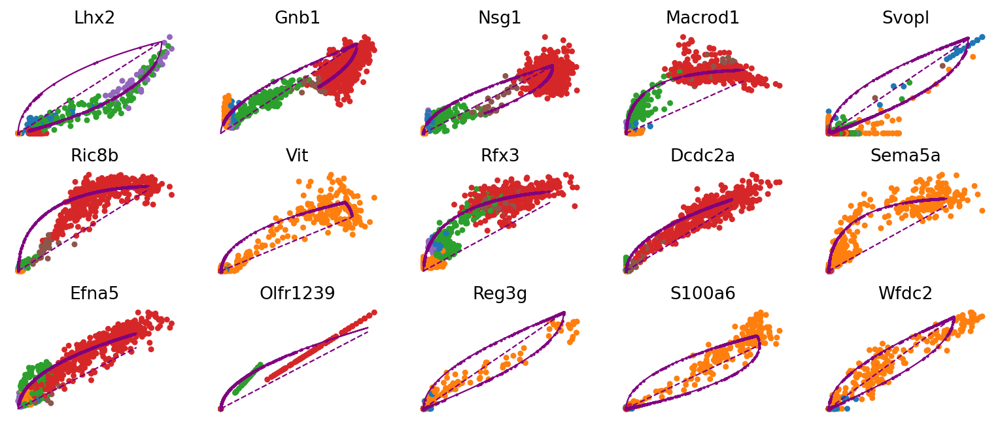

In [137]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(f, basis=top_genes[:15], ncols=5, frameon=False, color = 'celltype',save = 'toplikelihood-15genes_scatterplot')

CLUSTER SPECIFIC TOP LIKELIHOOD GENES

In [138]:
scv.tl.rank_dynamical_genes(f, groupby='celltype')
df = scv.get_df(f, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,GBC cells,HBC cells,Immature cells,Mature cells,Pecursor cells,Transition cells
0,Lhx2,Wfdc2,Rfx3,Gnb1,Lhx2,Gnb1
1,Svopl,Vit,Lhx2,Nsg1,Top2a,Sphkap
2,Top2a,Sema5a,Pcolce2,Macrod1,Sct,Rfx3
3,Sct,S100a6,Elavl2,Rtn1,Mybl1,Nsg1
4,Grik4,Apoe,Crabp1,Ric8b,Tubb3,Macrod1


In [139]:
df.to_csv('rank_dynamical_genes.csv')

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Immature cells.pdf


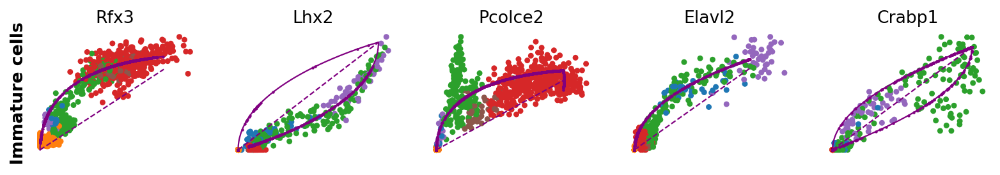

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Mature cells.pdf


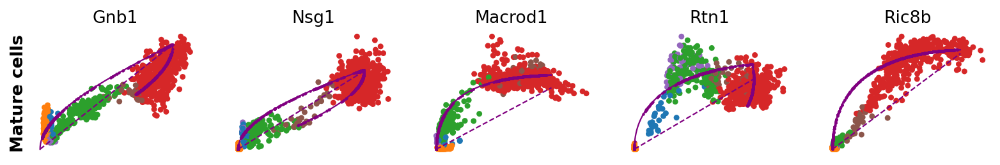

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Transition cells.pdf


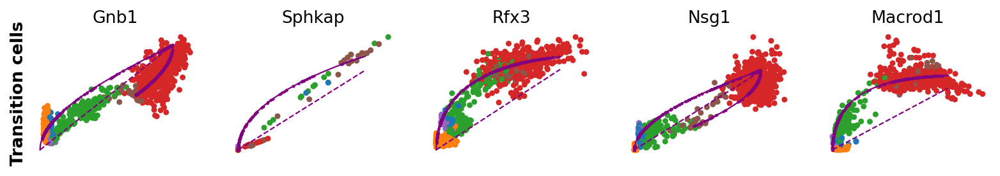

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Pecursor cells.pdf


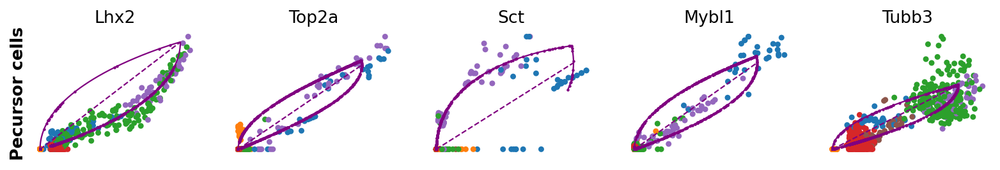

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}HBC cells.pdf


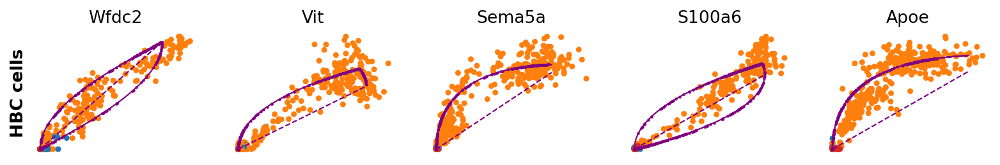

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}GBC cells.pdf


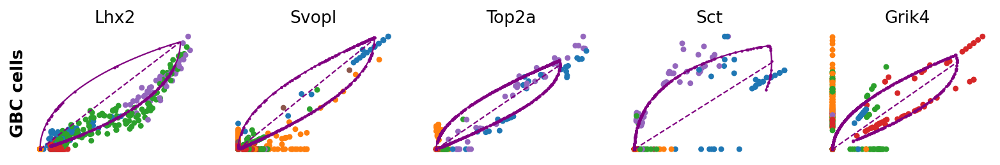

In [140]:
for cluster in ['Immature cells', 'Mature cells', 'Transition cells', 'Pecursor cells', 'HBC cells', 'GBC cells']:
    scv.pl.scatter(f, df[cluster][:5], ylabel=cluster, frameon=False, color = 'celltype', save= 'cluster-specific_likelihood_genes{x}'+cluster)


# CELL RANK

In [114]:
rmask= (f.obs["celltype"]  != "HBC cells")
rf=f[rmask].copy()

In [115]:
rf

AnnData object with n_obs × n_vars = 756 × 2000
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors', 'celltype_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

In [120]:
cr.tl.terminal_states(rf, n_states=2,  weight_connectivities=0.2,cluster_key='celltype')

saving figure to file ./figures/scvelo_cellrank_lineage1_Terminalstates.pdf


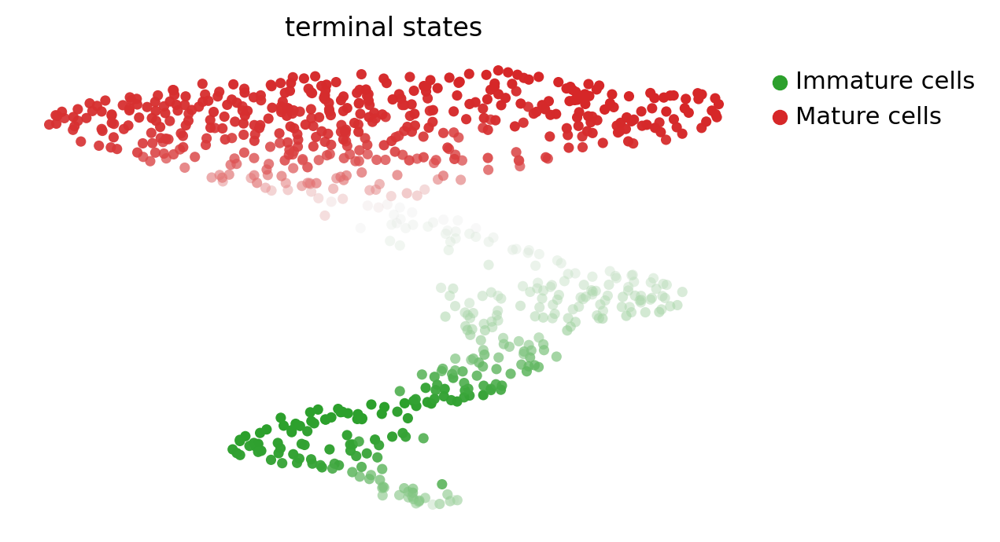

In [121]:
cr.pl.terminal_states(rf, cluster_key='celltype', save = 'cellrank_lineage1_Terminalstates.pdf')

In [122]:
cr.tl.terminal_states(f, n_states=2,  weight_connectivities=0.2,cluster_key='celltype')

saving figure to file ./figures/scvelo_cellrank_Terminalstates.pdf


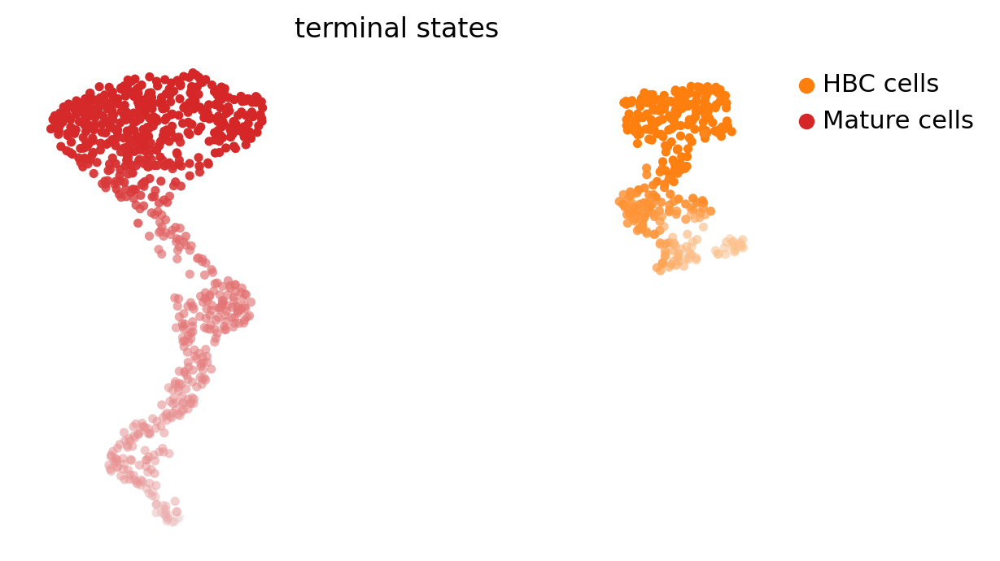

In [123]:
cr.pl.terminal_states(f, cluster_key='celltype', save = 'cellrank_Terminalstates.pdf')

saving figure to file ./figures/scvelo_cellrank_initialstates.pdf


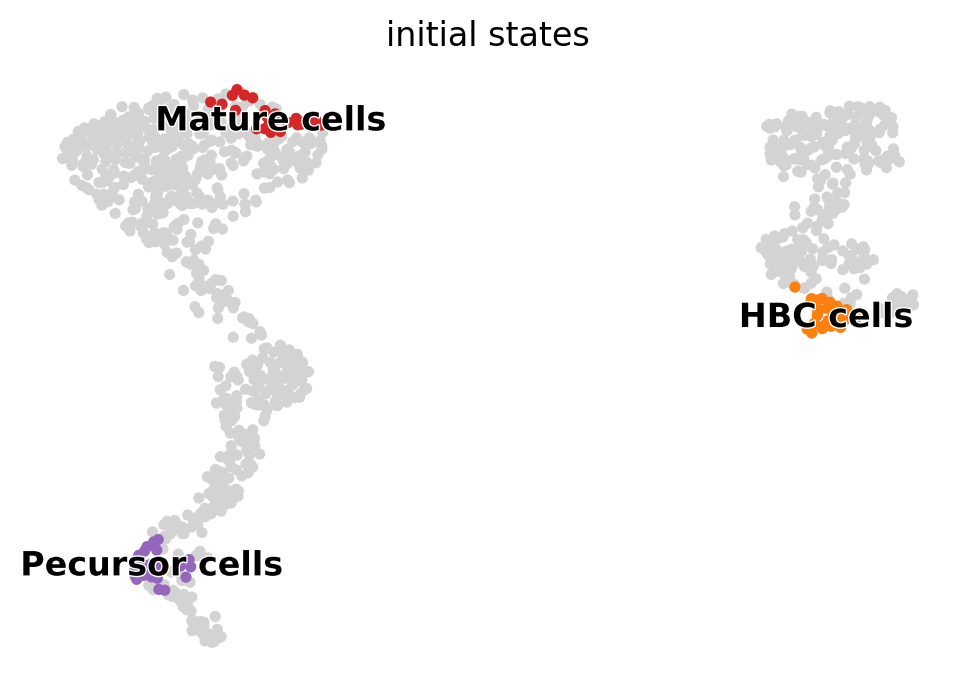

In [125]:
cr.tl.initial_states(f, n_states=3, cluster_key='celltype')
cr.pl.initial_states(f, discrete=True, save = 'cellrank_initialstates.pdf')

saving figure to file ./figures/scvelo_cellrank_lineages.pdf


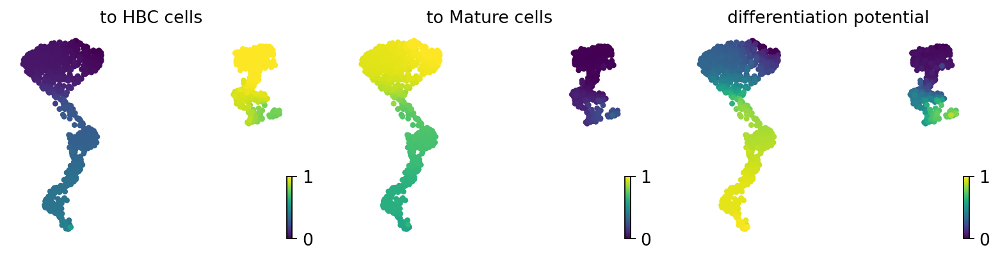

In [126]:
cr.tl.lineages(f)
cr.pl.lineages(f, same_plot=False,rescale_color = [0,1], save = 'cellrank_lineages.pdf')

In [140]:
scv.tl.recover_dynamics(f)

recovering dynamics (using 1/20 cores)



    finished (0:01:33) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [141]:
scv.tl.latent_time(f, root_key= 'initial_state_probs', end_key='terminal_states_probs')

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [142]:
scv.tl.paga(f, groups='celltype', root_key='initial_state_probs', end_key='terminal_states_probs',
            use_time_prior='velocity_pseudotime')

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/home/sanjay/anaconda3/lib/python3.8/site-packages/cellrank/pl/_cluster_fates.py:514: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


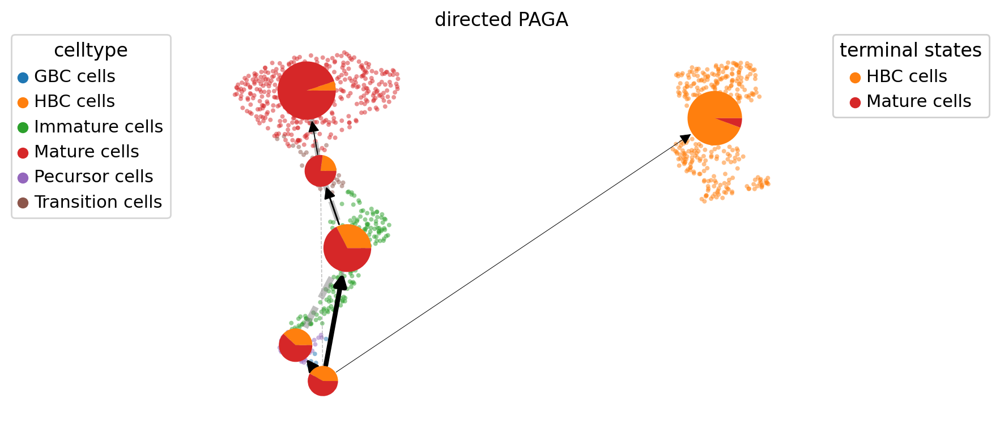

In [143]:
cr.pl.cluster_fates(f, mode="paga_pie", cluster_key="celltype", basis='umap', 
                    legend_kwargs={'loc': 'top right out'}, legend_loc='top left out', 
                    node_size_scale=5, edge_width_scale=1, max_edge_width=4, title='directed PAGA', save = 'Cellrank-Differential_PAGA.svg')

In [144]:
cr.tl.lineage_drivers(f)

,HBC cells corr,HBC cells pval,HBC cells qval,HBC cells ci low,HBC cells ci high,Mature cells corr,Mature cells pval,Mature cells qval,Mature cells ci low,Mature cells ci high
Slc6a6,0.863886,0.0,NaN,0.848030,0.878196,-0.863886,0.0,NaN,-0.878196,-0.848030
Krt17,0.851867,0.0,NaN,0.834735,0.867351,-0.851867,0.0,NaN,-0.867351,-0.834736
Fxyd3,0.831874,0.0,NaN,0.812664,0.849277,-0.831873,0.0,NaN,-0.849277,-0.812664
Ifitm3,0.822677,0.0,NaN,0.802530,0.840950,-0.822677,0.0,NaN,-0.840950,-0.802530
Krt5,0.821398,0.0,NaN,0.801121,0.839791,-0.821398,0.0,NaN,-0.839791,-0.801121
...,...,...,...,...,...,...,...,...,...,...
Dgkk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gm5938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P2ry10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Tnmd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [145]:
root_idx = np.where(f.obs['celltype'] == 'GBC cells')[0][0]

In [146]:
f.uns['iroot'] = root_idx

In [147]:
scp.tl.dpt(f)

saving figure to file ./figures/scvelo_cellrank_combinedgraph.pdf


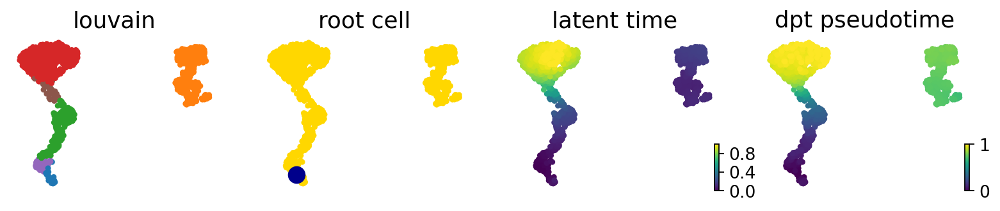

In [148]:
# compue dpt, starting from CellRank defined root cell
scv.pl.scatter(f, color=['celltype', root_idx, 'latent_time', 'dpt_pseudotime'], fontsize=16,
               cmap='viridis', perc=[2, 98], colorbar=True, rescale_color=[0, 1],
               title=['louvain', 'root cell', 'latent time', 'dpt pseudotime'], save = 'cellrank_combinedgraph.pdf')

In [149]:
model = cr.ul.models.GAM(f)

ADVANCE

In [150]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(f)

In [151]:
vk.compute_transition_matrix()

<Velo>

In [152]:
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(f).compute_transition_matrix()

In [153]:
combined_kernel = 0.8 * vk + 0.2 * ck
root_idx = np.where(f.obs['celltype'] == 'HBC cells')[0][0]
f.uns['iroot'] = root_idx


In [154]:
from cellrank.tl.kernels import PalantirKernel
pk = PalantirKernel(f, time_key='dpt_pseudotime').compute_transition_matrix()
print(pk)

<Pala[k=3, dnorm=True, n_neighs=30]>


In [155]:
from cellrank.tl.estimators import GPCCA
g = GPCCA(combined_kernel)
print(g)

GPCCA[n=1093, kernel=((0.8 * <Velo[softmax_scale=7.15, mode=deterministic, seed=51917, scheme=<CorrelationScheme>]>) + (0.2 * <Conn[dnorm=True]>))]


/home/sanjay/anaconda3/lib/python3.8/site-packages/cellrank/tl/estimators/_decomposition.py:267: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


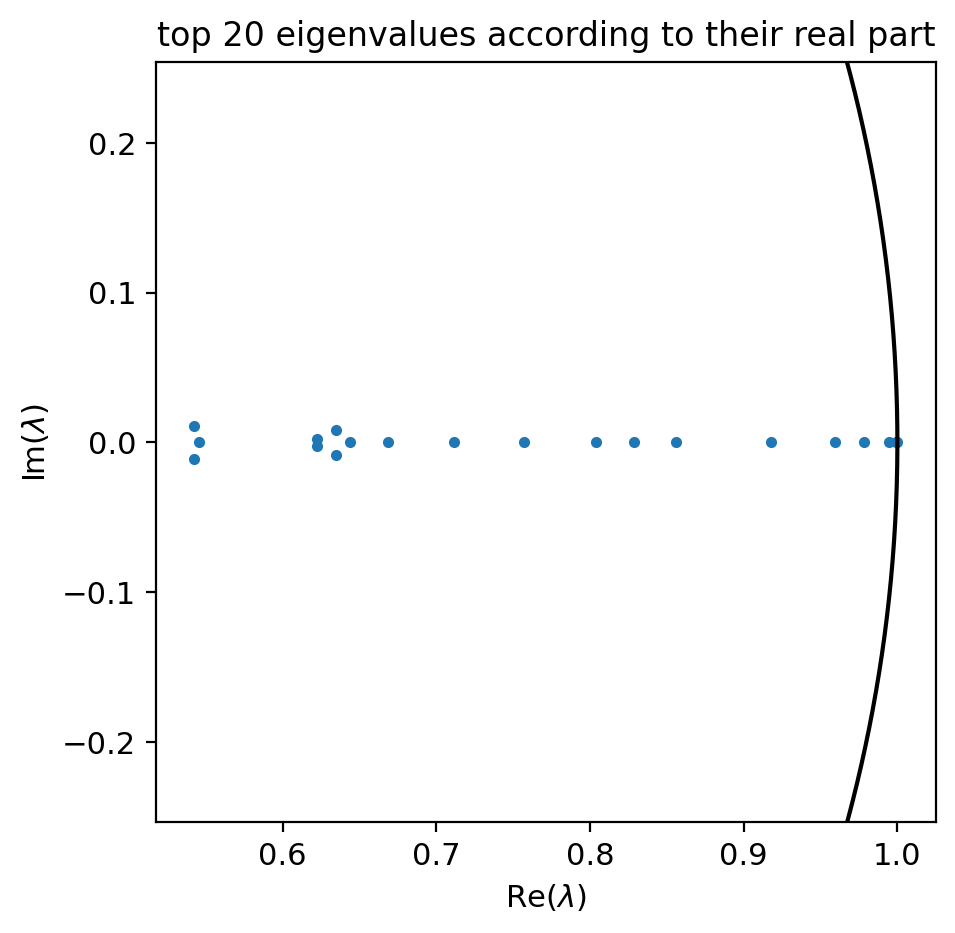

In [156]:
g.compute_schur(n_components=20)
g.plot_spectrum(save='cellrank-eigenvalues.pdf')

saving figure to file ./figures/scvelo_cellrank-schurvector.pdf


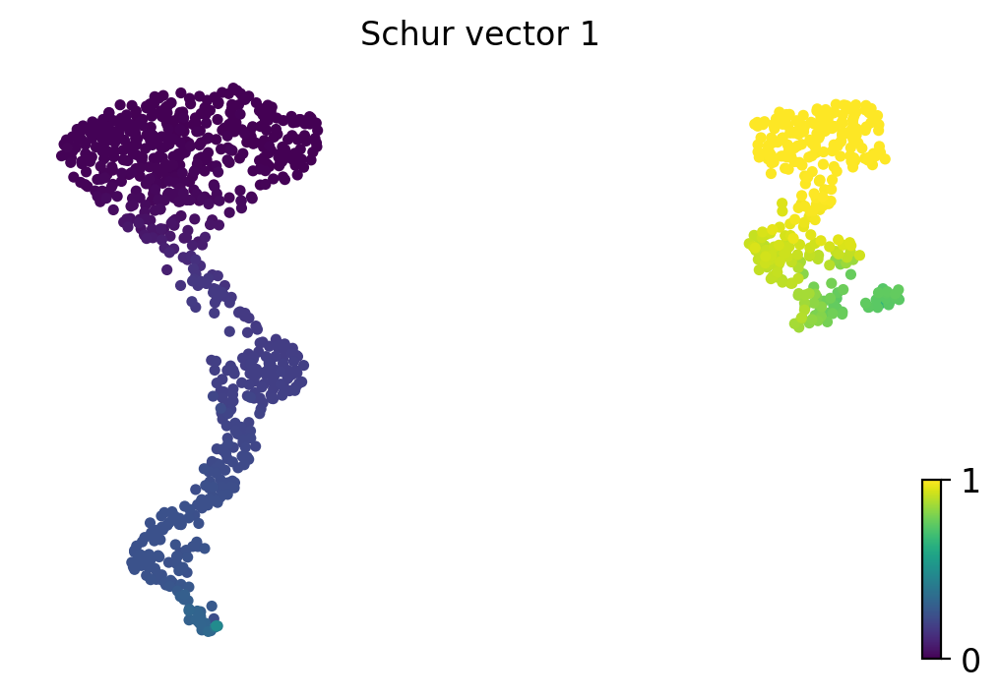

In [157]:
g.plot_schur(use=1, rescale_color = [0,1], save='cellrank-schurvector.pdf')

saving figure to file ./figures/scvelo_cellrank-macrostates.pdf


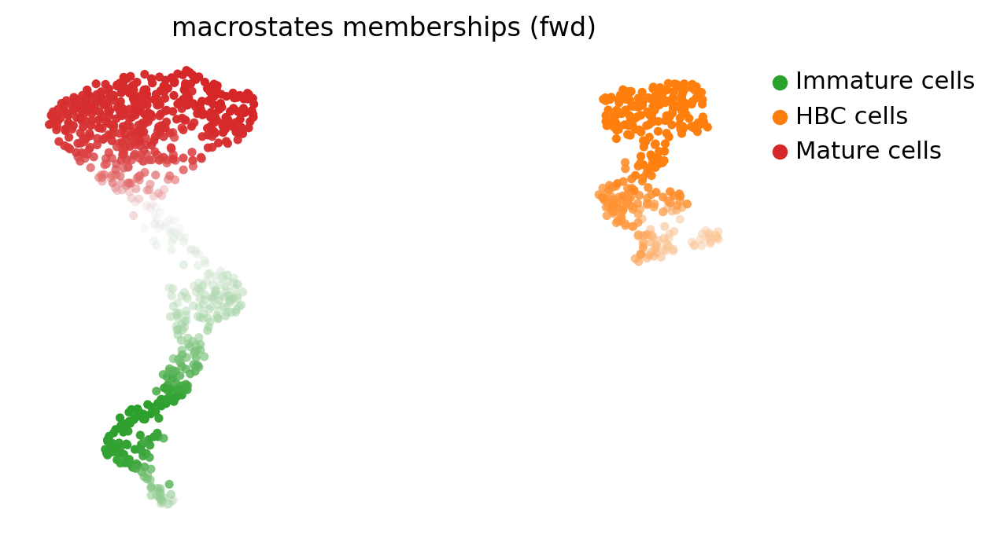

In [158]:
g.compute_macrostates(n_states=3, cluster_key='celltype')
g.plot_macrostates(save = 'cellrank-macrostates.pdf')

saving figure to file ./figures/scvelo_cellrank-macrostates-diff-plots.pdf


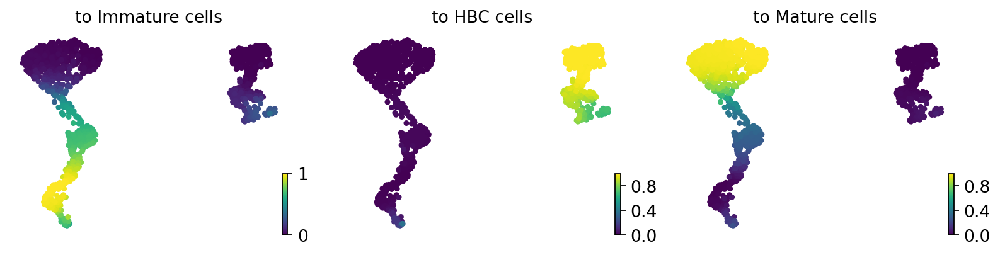

In [159]:
g.plot_macrostates(same_plot=False, rescale_color = [0,1], save = 'cellrank-macrostates-diff-plots.pdf')

saving figure to file ./figures/scvelo_cellrank_macrostates-forward.pdf


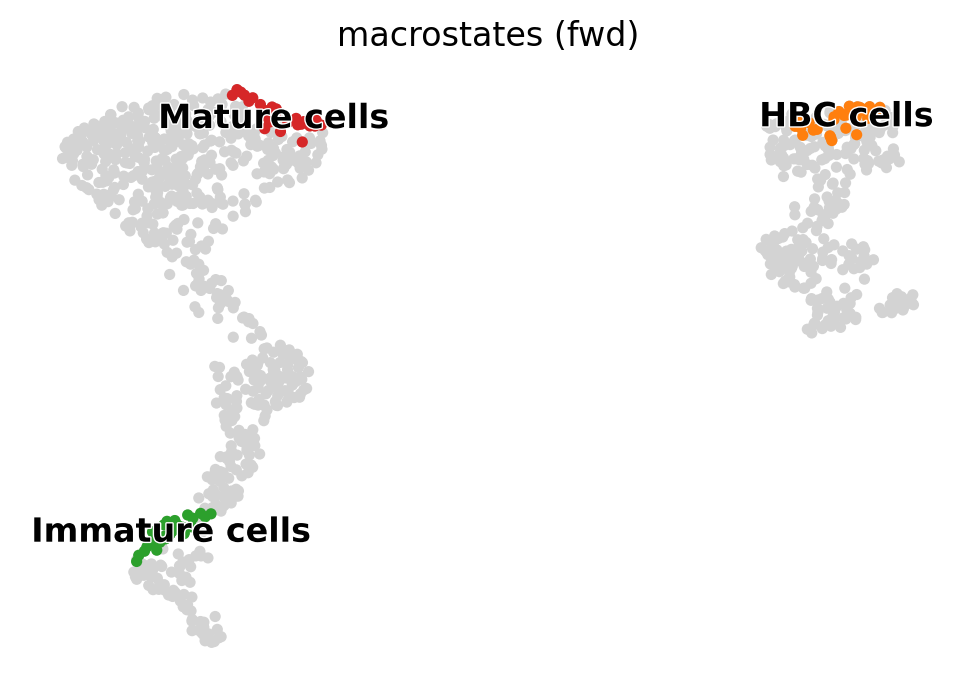

In [160]:
g.plot_macrostates(discrete=True, save = 'cellrank_macrostates-forward.pdf')

In [161]:
g.set_terminal_states_from_macrostates(["Mature cells", "Immature cells"])

In [162]:
g.compute_absorption_probabilities()

/home/sanjay/anaconda3/lib/python3.8/site-packages/cellrank/pl/_cluster_fates.py:514: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


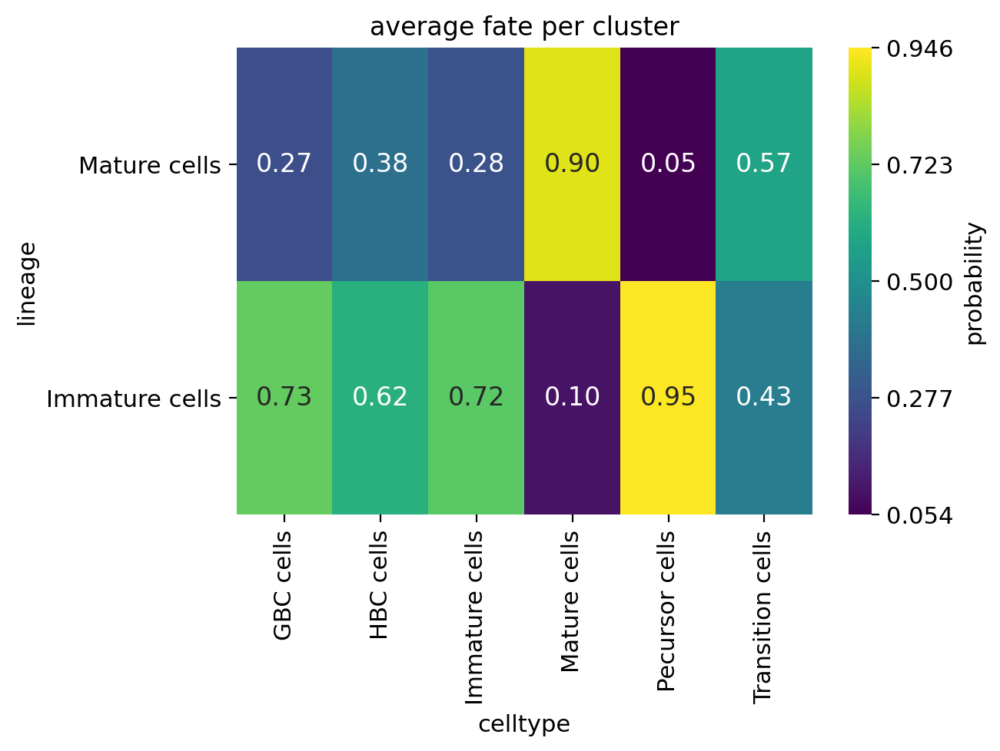

In [163]:
cr.pl.cluster_fates(f, cluster_key='celltype', mode='heatmap', save = 'cellrank-heatmap-clusterfate.pdf')

# Differential kinetics

In [188]:
scv.tl.differential_kinetic_test(f, groupby='celltype')


testing for differential kinetics
    finished (0:00:49) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


In [189]:
var_names = ['Gap43']

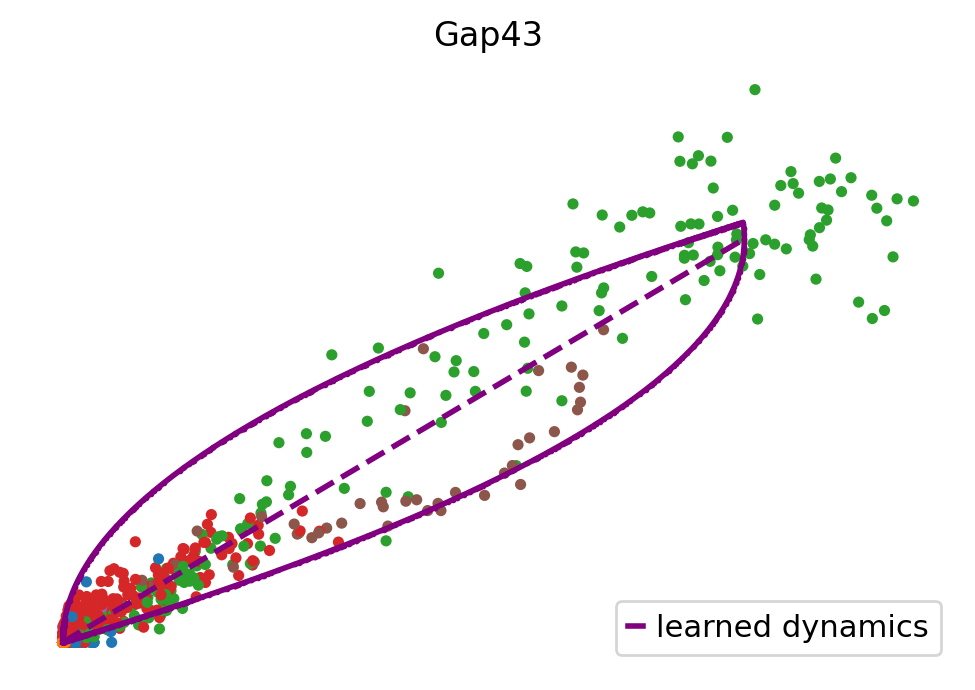

In [190]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(f, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

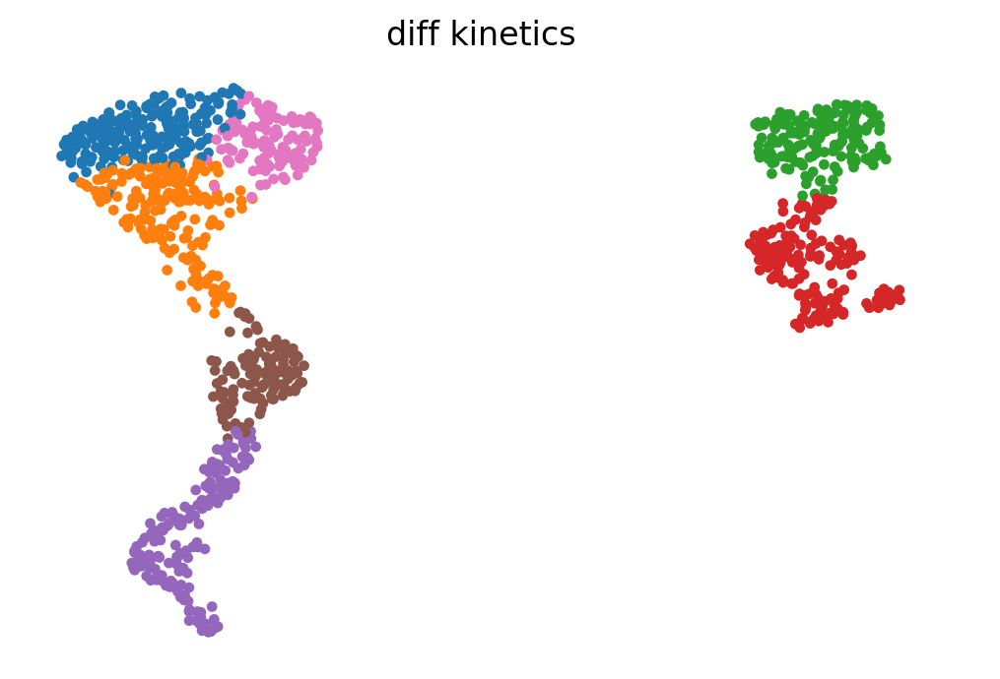

In [191]:
diff_clusters=list(f[:, var_names].var['fit_diff_kinetics'])
scv.pl.scatter(f, legend_loc='right', size=60, title='diff kinetics',
               add_outline=diff_clusters)


TOP LIKELIHOOD genes

In [192]:
scv.tl.recover_dynamics(f)


recovering dynamics (using 1/20 cores)



    finished (0:02:23) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [193]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(f, groupby='celltype')

testing for differential kinetics
    finished (0:00:48) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


saving figure to file ./figures/scvelo_differential-kinetics-15genes.pdf


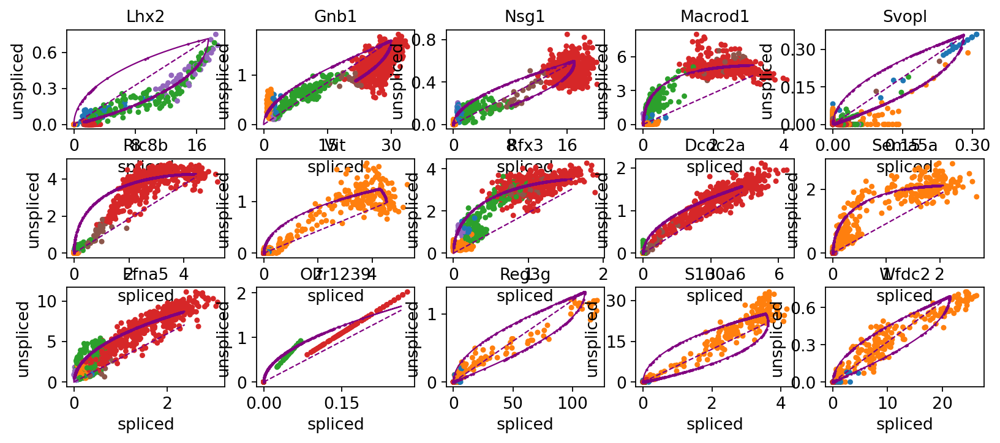

In [194]:
scv.pl.scatter(f, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', save = 'differential-kinetics-15genes.pdf')

saving figure to file ./figures/scvelo_differential-kinetics-15-30genes.pdf


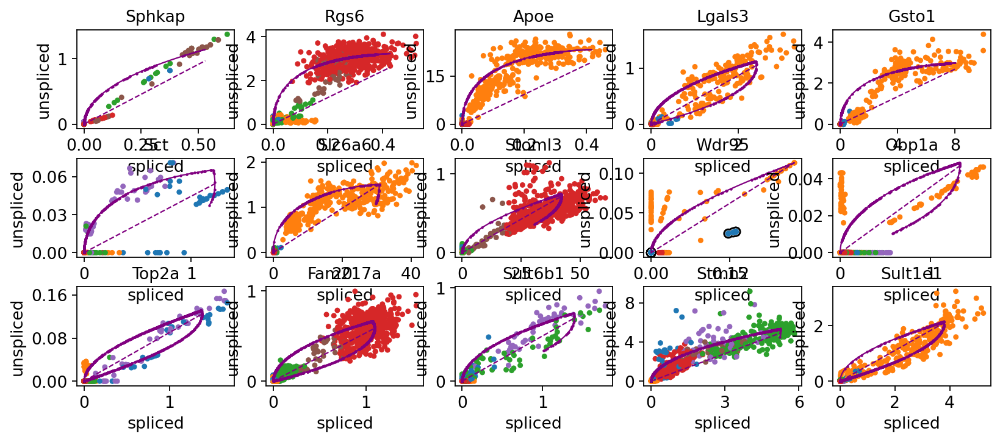

In [195]:
scv.pl.scatter(f, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', save = 'differential-kinetics-15-30genes.pdf')

RECOMPUTING VELOCITIES

In [196]:
scv.tl.velocity(f, diff_kinetics=True, groupby='celltype')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_differential-velocity.pdf


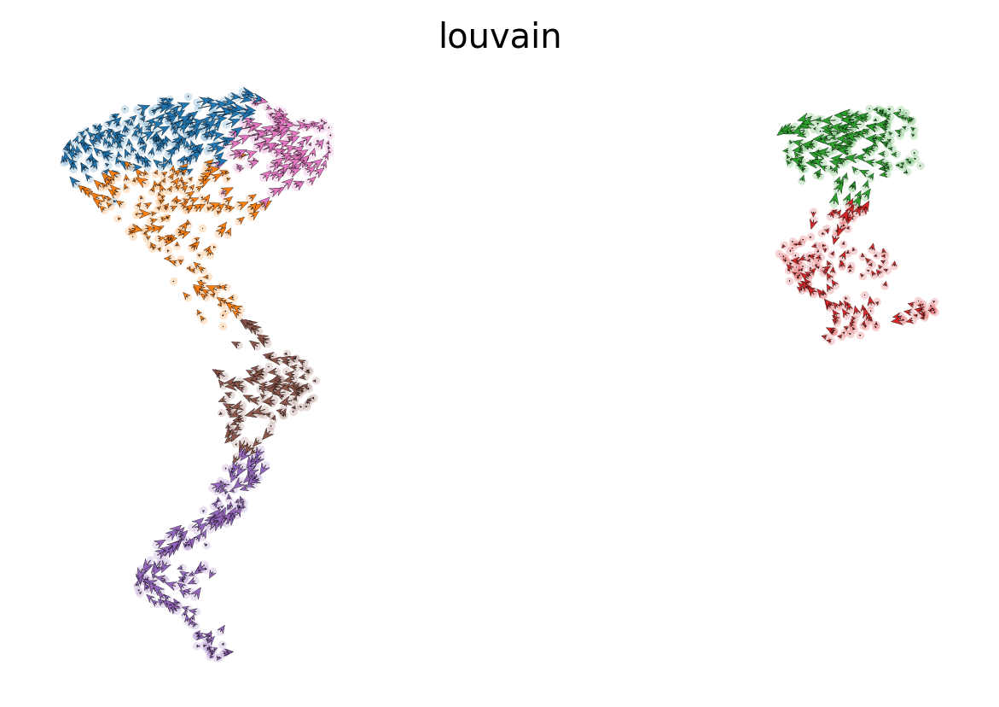

In [197]:
scv.pl.velocity_embedding(f, dpi=120, arrow_size=2, arrow_length=2, save = 'differential-velocity.pdf')

DGE

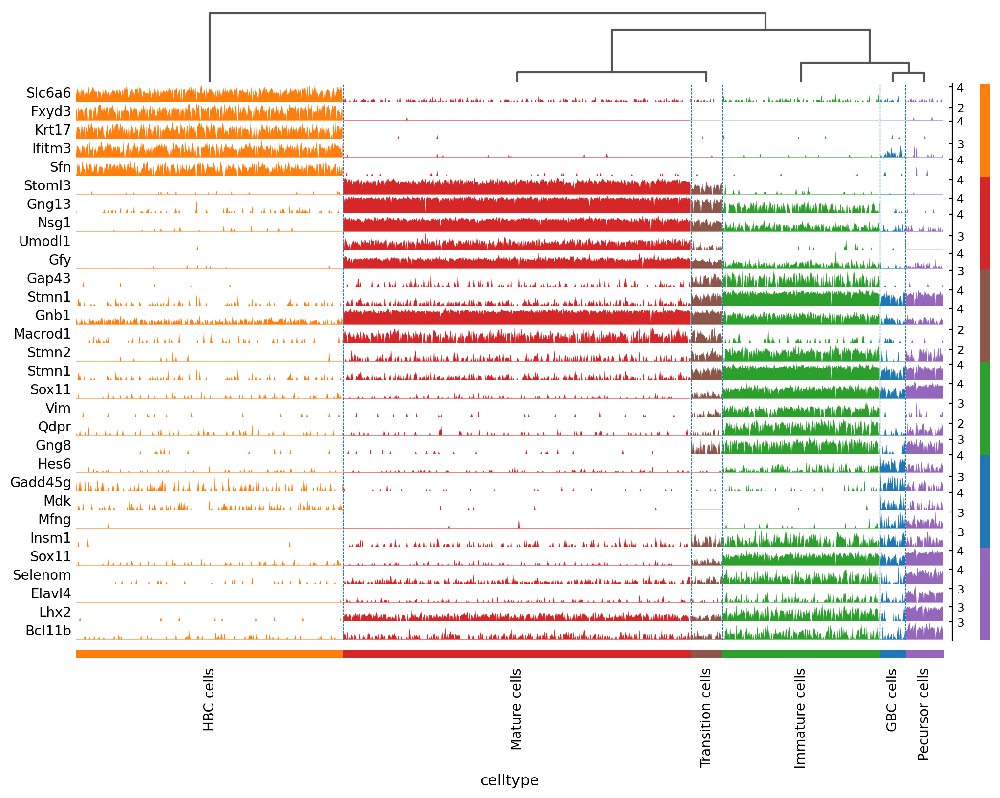

In [199]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=5) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'diffexp5genes.pdf')

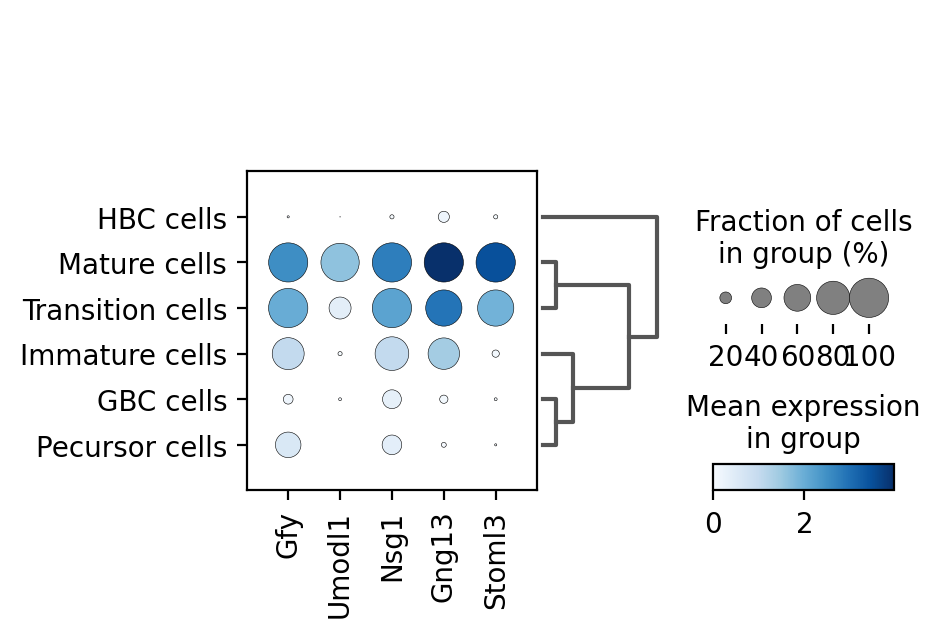

In [200]:
m = ['Gfy', 'Umodl1', 'Nsg1', 'Gng13', 'Stoml3'] 
scp.pl.dotplot(f, m,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-mature-diffexp.pdf')

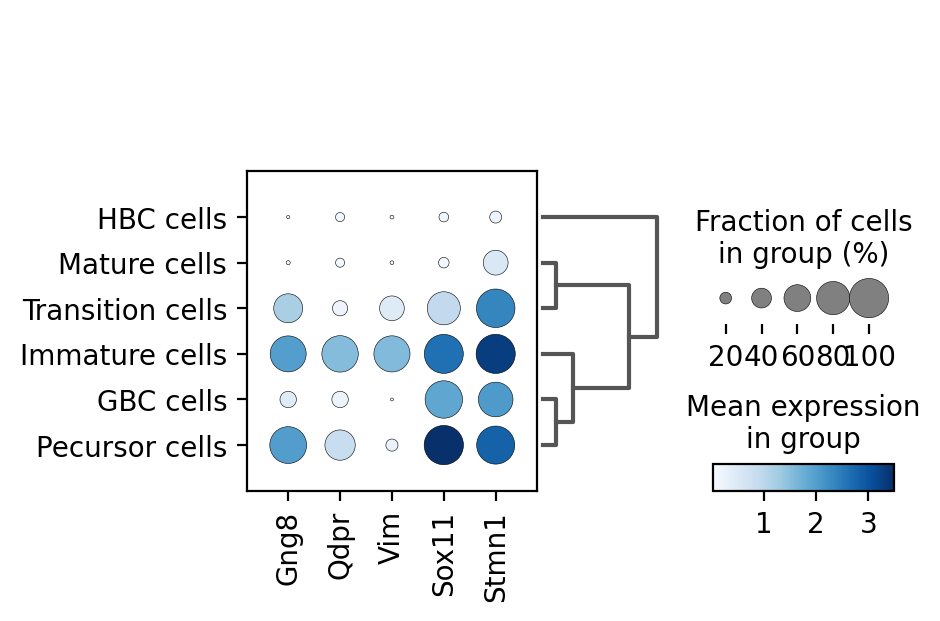

In [201]:
im =['Gng8', 'Qdpr', 'Vim', 'Sox11', 'Stmn1'] 
scp.pl.dotplot(f, im,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-immature-diffexp.pdf')

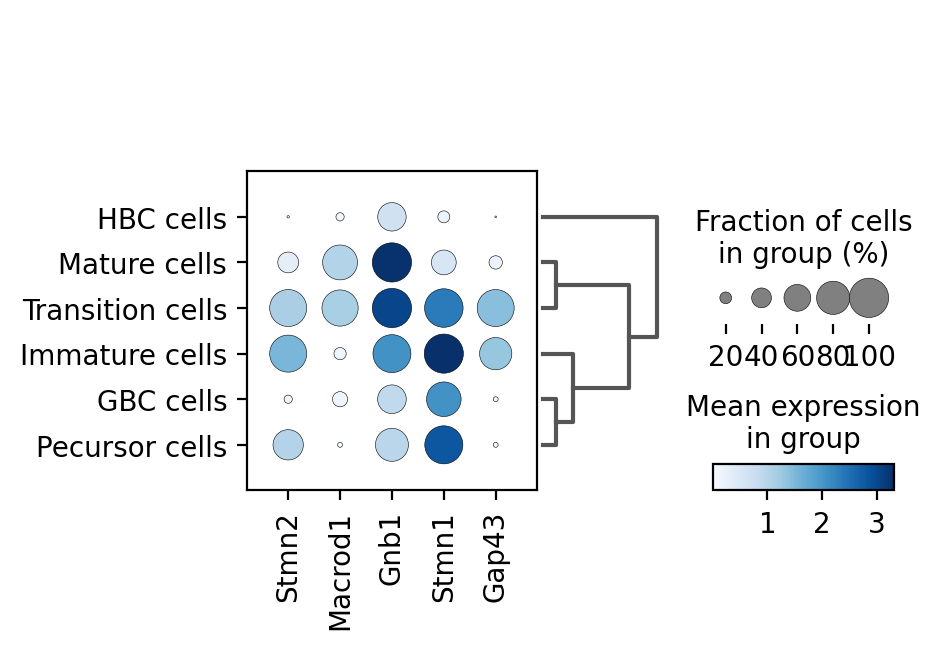

In [202]:
tr = ['Stmn2', 'Macrod1', 'Gnb1', 'Stmn1', 'Gap43']
scp.pl.dotplot(f, tr,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-trans-diffexp.pdf')

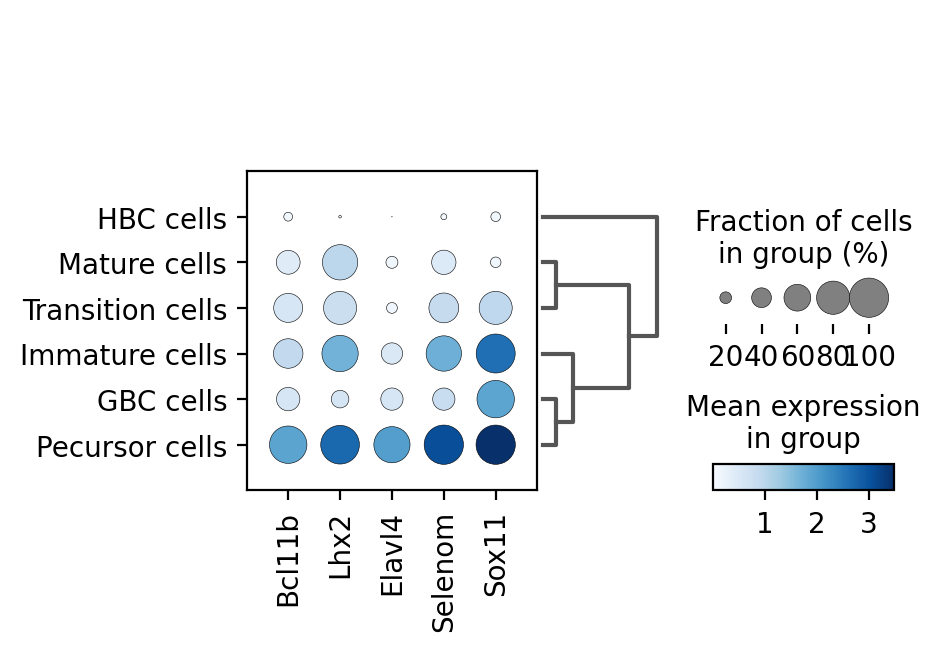

In [203]:
pr = ['Bcl11b', 'Lhx2', 'Elavl4', 'Selenom', 'Sox11'] 
scp.pl.dotplot(f, pr,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-precusor-diffexp.pdf')

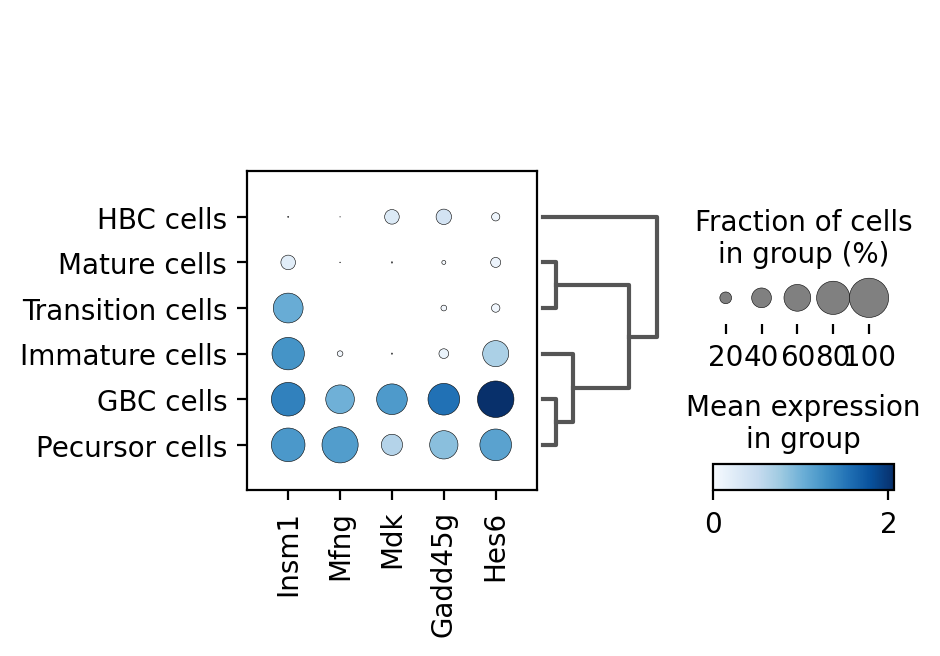

In [204]:
g =  ['Insm1', 'Mfng', 'Mdk', 'Gadd45g', 'Hes6'] 
scp.pl.dotplot(f, g,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-GBC-diffexp.pdf')

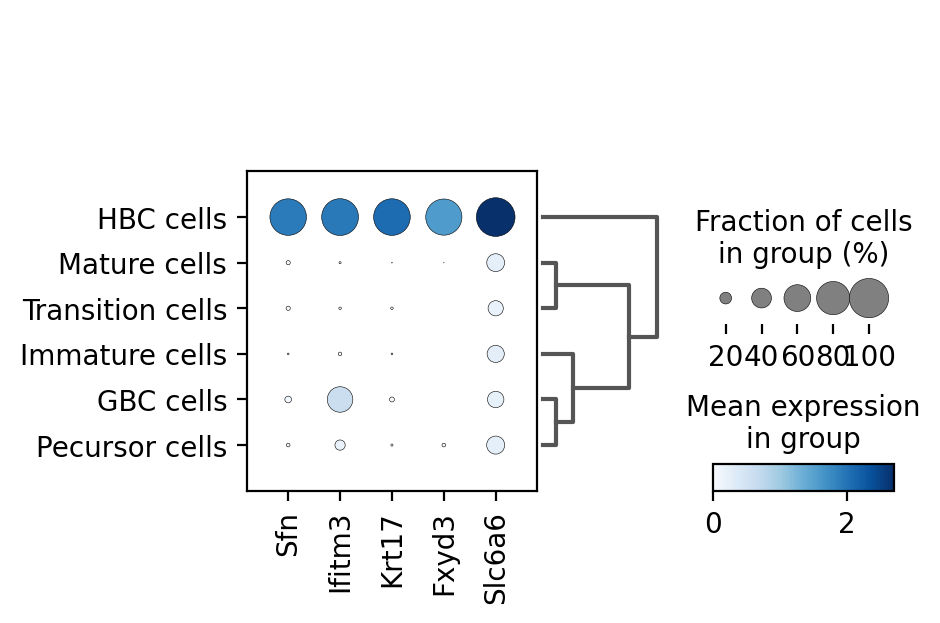

In [205]:
h = ['Sfn', 'Ifitm3', 'Krt17', 'Fxyd3', 'Slc6a6'] 
scp.pl.dotplot(f, h,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-HBC-diffexp.pdf')

velocity length and confidence

In [206]:
vl = f.obs['velocity_length']
vl.to_csv('velocity_length_wild.csv')

In [207]:
vc = f.obs['velocity_confidence']
vc.to_csv('velocity_confi_wild.csv')